In [1]:


# Importing necessary libraries
import os
import glob
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score, average_precision_score
from sklearn.metrics import roc_curve, auc, precision_recall_curve
from xgboost import XGBClassifier

import keras
from keras.models import Sequential
from keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from kerastuner import HyperModel
from kerastuner.tuners import RandomSearch
from keras.callbacks import EarlyStopping
from keras.layers import Dropout
from keras.models import load_model, save_model

import tensorflow as tf


/var/folders/1g/bksky7bd2wb927qzgc2fqjhc0000gn/T/ipykernel_1826/4118812801.py:20: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  from kerastuner import HyperModel


In [2]:
# Load the data
waveforms = pd.read_csv('~/data/practicum-data/ABRpresto data/processed_data/updated_processed_waveforms.csv')
thresholds = pd.read_csv('~/data/practicum-data/ABRpresto data/ABRpresto data/Manual Thresholds.csv')

waveforms = waveforms.rename(columns={"mouse_id": "id", "time_point": "timepoint"})

# Perform the left join on specified columns
merged_df = pd.merge( 
    thresholds, 
    waveforms,
    how='right', 
    on=['id', 'timepoint', 'ear', 'frequency']
)

In [3]:
merged_df.head()

,id,timepoint,ear,frequency,min_level,max_level,manual threshold,level,1,2,...,234,235,236,237,238,239,240,241,242,243
0,155,1,left,4000.0,15.0,105.0,70.0,15.0,-1.221967e-07,-1.025707e-07,...,1.701512e-07,1.761305e-07,1.915403e-07,1.983019e-07,1.896948e-07,1.718040e-07,1.550264e-07,1.347835e-07,1.044327e-07,6.399865e-08
1,155,1,left,4000.0,15.0,105.0,70.0,20.0,1.649993e-07,1.665737e-07,...,-4.024921e-08,-6.394044e-08,-6.811376e-08,-5.390779e-08,-3.666727e-08,-1.600967e-08,1.787785e-09,-2.048963e-09,-2.039571e-08,-3.387016e-08
2,155,1,left,4000.0,15.0,105.0,70.0,25.0,1.649815e-07,1.497355e-07,...,3.274994e-09,-5.608839e-08,-1.014989e-07,-8.578703e-08,-6.040631e-08,-7.962887e-08,-1.092591e-07,-9.873568e-08,-5.931209e-08,-2.430632e-08
3,155,1,left,4000.0,15.0,105.0,70.0,30.0,1.143589e-07,1.241433e-07,...,1.205242e-08,-3.354167e-09,-4.702899e-09,-3.079469e-10,8.391719e-10,3.972793e-09,1.610461e-08,3.059214e-08,2.769940e-08,-1.027032e-08
4,155,1,left,4000.0,15.0,105.0,70.0,35.0,1.148238e-07,1.387666e-07,...,-1.771918e-07,-1.909677e-07,-2.315494e-07,-2.652825e-07,-2.680147e-07,-2.507890e-07,-2.371962e-07,-2.259854e-07,-1.765978e-07,-6.666764e-08


In [4]:
import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
import numpy as np

class WaveformDataset(Dataset):
    def __init__(self, df):
        # Extract waveform data as numpy array (float32)
        df = df[~np.isinf(df['manual threshold'])].reset_index(drop=True)
        waveforms = df[[str(i) for i in range(1, 244)]].values.astype('float32')

        # Normalize each waveform row: zero mean, unit std
        means = waveforms.mean(axis=1, keepdims=True)
        stds = waveforms.std(axis=1, keepdims=True) + 1e-8  # avoid div by zero
        waveforms = (waveforms - means) / stds

        # Convert to tensor
        self.waveforms = torch.tensor(waveforms)

        # Threshold condition flag
        flags = (df['level'].values >= df['manual threshold'].values).astype(np.float32)
        self.flags = torch.tensor(flags)

    def __len__(self):
        return len(self.waveforms)

    def __getitem__(self, idx):
        # return waveform, target, threshold flag
        return self.waveforms[idx], self.waveforms[idx], self.flags[idx]

# Usage
dataset = WaveformDataset(merged_df)
dataloader = DataLoader(dataset, batch_size=1000, shuffle=True)

# DVAE model

In [5]:
import torch
import torch.nn as nn

class Conv1DVAE(nn.Module):
    def __init__(self, input_size=243, latent_dim=10):
        super().__init__()
        self.latent_dim = latent_dim

        # Encoder
        self.encoder_conv = nn.Sequential(
            nn.Conv1d(1, 16, kernel_size=5, stride=2, padding=2),  # [B, 16, ~122]
            nn.BatchNorm1d(16),
            nn.ReLU(),
            nn.Conv1d(16, 32, kernel_size=4, stride=2, padding=2), # [B, 32, ~62]
            nn.BatchNorm1d(32),
            nn.ReLU(),
            nn.Conv1d(32, 64, kernel_size=4, stride=2, padding=2), # [B, 64, ~32]
            nn.BatchNorm1d(64),
            nn.ReLU(),
        )

        # Dynamically determine flatten size
        with torch.no_grad():
            dummy = torch.zeros(1, 1, input_size)
            dummy_out = self.encoder_conv(dummy)
            self.enc_channels = dummy_out.shape[1]  # should be 64
            self.enc_length = dummy_out.shape[2]    # should be 32
            self.flattened_dim = self.enc_channels * self.enc_length

        # VAE projection
        self.fc_mu = nn.Linear(self.flattened_dim, latent_dim)
        self.fc_logvar = nn.Linear(self.flattened_dim, latent_dim)

        # Decoder
        self.decoder_input = nn.Linear(latent_dim, self.flattened_dim)
        self.decoder_conv = nn.Sequential(
            nn.ConvTranspose1d(64, 32, kernel_size=5, stride=2, padding=2, output_padding=1),
            nn.BatchNorm1d(32),
            nn.ReLU(),
            nn.ConvTranspose1d(32, 16, kernel_size=5, stride=2, padding=2, output_padding=1),
            nn.BatchNorm1d(16),
            nn.ReLU(),
            nn.ConvTranspose1d(16, 1, kernel_size=5, stride=2, padding=2, output_padding=1),
        )

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def encode(self, x):
        x = self.encoder_conv(x).flatten(start_dim=1)
        mu = self.fc_mu(x)
        logvar = self.fc_logvar(x)
        z = self.reparameterize(mu, logvar)
        return z, mu, logvar

    def decode(self, z):
        x = self.decoder_input(z)
        x = x.view(-1, self.enc_channels, self.enc_length)
        return self.decoder_conv(x)

    def forward(self, x):
        x = x.unsqueeze(1)
        z, mu, logvar = self.encode(x)
        x_recon = self.decode(z).squeeze(1)

        # Ensure shape match with input
        target_len = x.shape[-1]
        if x_recon.shape[1] > target_len:
            x_recon = x_recon[:, :target_len]
        elif x_recon.shape[1] < target_len:
            pad_len = target_len - x_recon.shape[1]
            x_recon = nn.functional.pad(x_recon, (0, pad_len))

        return x_recon, mu, logvar



In [ ]:
# def vae_loss_function(recon_x, x, mu, logvar):
#     # Normalize each waveform (row-wise)
#     norm = torch.norm(x, dim=1, keepdim=True) + 1e-8
#     recon_x_norm = recon_x / norm
#     x_norm = x / norm

#     # Create a weighting mask for the important region 50 to 100
#     # Shape: [batch_size, features], weights higher in important region
#     weights = torch.ones_like(x_norm)
#     weights[:, 50:101] = 5.0  # 5x penalty in that important segment (adjust multiplier)

#     # Weighted MSE: multiply squared error by weights
#     weighted_diff = weights * (recon_x_norm - x_norm) ** 2
#     recon_loss = torch.mean(weighted_diff)

#     # KL Divergence
#     kl_loss = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())

#     # Amplify reconstruction loss to penalize small errors more
#     recon_loss = recon_loss * 10000  # try scaling factor — tune this

#     return recon_loss + kl_loss, recon_loss, kl_loss

import torch.nn.functional as F

def vae_loss_function(recon_x, x, mu, logvar, recon_weight=1000):
    """
    Reconstruction loss based on smoothed curve similarity (area/shape).
    KL loss remains unchanged.
    """
    # Normalize row-wise to make magnitude invariant
    norm = torch.norm(x, dim=1, keepdim=True) + 1e-8
    recon_x_norm = recon_x / norm
    x_norm = x / norm

    # Add channel dimension for pooling: [B, 1, 243]
    recon_x_ = recon_x_norm.unsqueeze(1)
    x_ = x_norm.unsqueeze(1)

    # Smooth both using 1D avg pooling with kernel size 15
    recon_smooth = F.avg_pool1d(recon_x_, kernel_size=15, stride=1, padding=7)
    x_smooth = F.avg_pool1d(x_, kernel_size=15, stride=1, padding=7)

    # Compute smoothed absolute error (like L1)
    smooth_error = torch.abs(recon_smooth - x_smooth)  # [B, 1, ~243]

    # Weight important region 50:100
    weights = torch.ones_like(smooth_error)
    # This Weight is very important 
    # It gives more weight to the first peak of the ABR waveform
    # It is the most important region of the ABR waveform
    weights[:, :, 50:101] = 5.0 

    # Apply weighted mean over batch and time
    recon_loss = torch.mean(weights * smooth_error)

    # KL Divergence
    kl_loss = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())

    total_loss = recon_weight * recon_loss + kl_loss
    return total_loss, recon_loss, kl_loss


# Training


Epoch 1
  Batch 01 | Loss: 146.0406 | Recon: 0.1459 | KL: 0.124715 | CosSim Acc: 0.32%
  Batch 02 | Loss: 538.5343 | Recon: 0.1111 | KL: 427.471497 | CosSim Acc: 0.66%
  Batch 03 | Loss: 124.8995 | Recon: 0.0969 | KL: 28.004128 | CosSim Acc: 2.40%
  Batch 04 | Loss: 103.6933 | Recon: 0.0865 | KL: 17.181103 | CosSim Acc: 1.88%
  Batch 05 | Loss: 90.8720 | Recon: 0.0797 | KL: 11.203244 | CosSim Acc: 3.49%
  Batch 06 | Loss: 88.5492 | Recon: 0.0796 | KL: 8.941536 | CosSim Acc: 3.70%
  Batch 07 | Loss: 80.3775 | Recon: 0.0730 | KL: 7.381128 | CosSim Acc: 7.38%
  Batch 08 | Loss: 84.3112 | Recon: 0.0768 | KL: 7.545415 | CosSim Acc: 5.86%
  Batch 09 | Loss: 78.5454 | Recon: 0.0708 | KL: 7.764844 | CosSim Acc: 8.26%
  Batch 10 | Loss: 76.7448 | Recon: 0.0686 | KL: 8.123732 | CosSim Acc: 11.16%
  Batch 11 | Loss: 72.8669 | Recon: 0.0643 | KL: 8.558043 | CosSim Acc: 14.43%
  Batch 12 | Loss: 71.5790 | Recon: 0.0627 | KL: 8.918866 | CosSim Acc: 17.60%
  Batch 13 | Loss: 69.9714 | Recon: 0.0615 

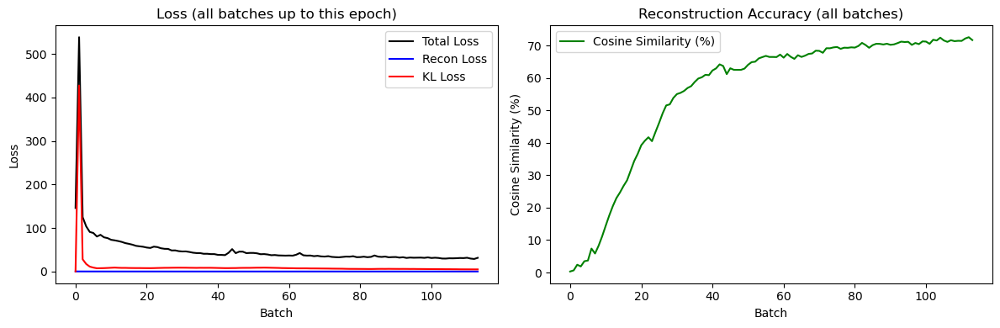

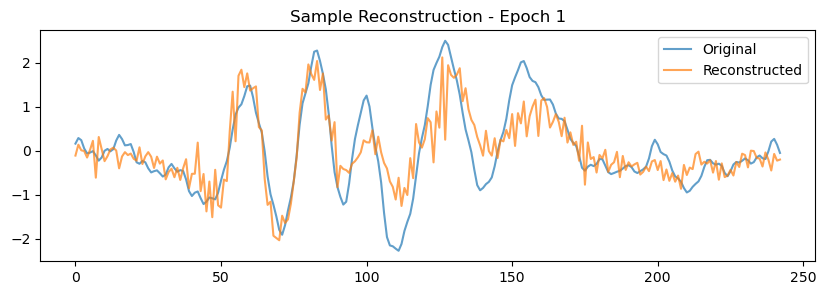


Epoch 2
  Batch 01 | Loss: 31.6892 | Recon: 0.0268 | KL: 4.880954 | CosSim Acc: 71.75%
  Batch 02 | Loss: 29.6328 | Recon: 0.0248 | KL: 4.790992 | CosSim Acc: 72.26%
  Batch 03 | Loss: 30.6019 | Recon: 0.0259 | KL: 4.667456 | CosSim Acc: 72.41%
  Batch 04 | Loss: 30.7453 | Recon: 0.0260 | KL: 4.757267 | CosSim Acc: 72.33%
  Batch 05 | Loss: 32.2601 | Recon: 0.0276 | KL: 4.671450 | CosSim Acc: 71.83%
  Batch 06 | Loss: 31.0623 | Recon: 0.0263 | KL: 4.736671 | CosSim Acc: 72.25%
  Batch 07 | Loss: 29.6657 | Recon: 0.0250 | KL: 4.715677 | CosSim Acc: 72.03%
  Batch 08 | Loss: 30.0706 | Recon: 0.0254 | KL: 4.686358 | CosSim Acc: 72.88%
  Batch 09 | Loss: 30.6606 | Recon: 0.0260 | KL: 4.623108 | CosSim Acc: 72.44%
  Batch 10 | Loss: 28.6872 | Recon: 0.0241 | KL: 4.602601 | CosSim Acc: 72.79%
  Batch 11 | Loss: 30.2049 | Recon: 0.0256 | KL: 4.605756 | CosSim Acc: 72.24%
  Batch 12 | Loss: 29.2612 | Recon: 0.0247 | KL: 4.519269 | CosSim Acc: 72.42%
  Batch 13 | Loss: 30.4175 | Recon: 0.0260 

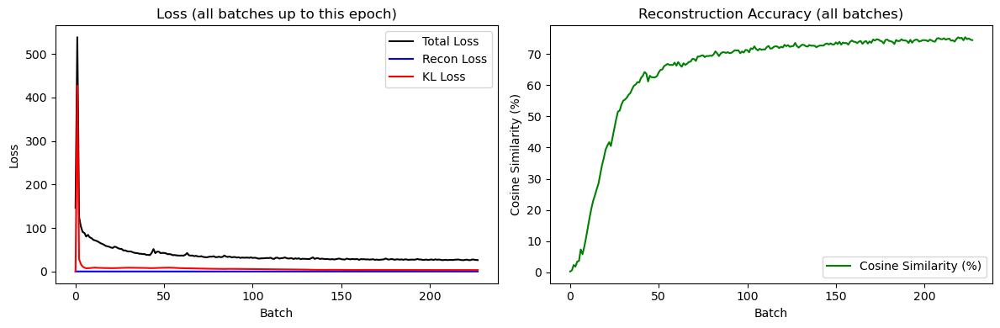

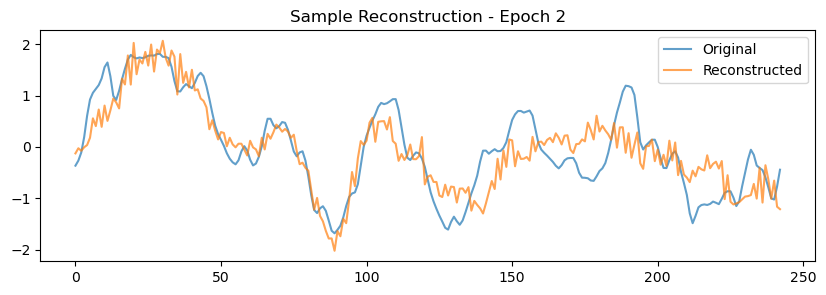


Epoch 3
  Batch 01 | Loss: 26.6306 | Recon: 0.0233 | KL: 3.323993 | CosSim Acc: 74.60%
  Batch 02 | Loss: 26.9983 | Recon: 0.0236 | KL: 3.353153 | CosSim Acc: 74.55%
  Batch 03 | Loss: 26.7219 | Recon: 0.0233 | KL: 3.376588 | CosSim Acc: 74.37%
  Batch 04 | Loss: 26.4754 | Recon: 0.0231 | KL: 3.381020 | CosSim Acc: 74.60%
  Batch 05 | Loss: 27.4307 | Recon: 0.0240 | KL: 3.421910 | CosSim Acc: 74.52%
  Batch 06 | Loss: 26.5339 | Recon: 0.0231 | KL: 3.398104 | CosSim Acc: 74.95%
  Batch 07 | Loss: 27.3142 | Recon: 0.0239 | KL: 3.379259 | CosSim Acc: 74.59%
  Batch 08 | Loss: 26.0226 | Recon: 0.0227 | KL: 3.333609 | CosSim Acc: 75.15%
  Batch 09 | Loss: 26.9895 | Recon: 0.0237 | KL: 3.288014 | CosSim Acc: 74.66%
  Batch 10 | Loss: 27.0425 | Recon: 0.0237 | KL: 3.321095 | CosSim Acc: 74.52%
  Batch 11 | Loss: 26.4565 | Recon: 0.0231 | KL: 3.335738 | CosSim Acc: 74.62%
  Batch 12 | Loss: 26.1531 | Recon: 0.0228 | KL: 3.312021 | CosSim Acc: 74.88%
  Batch 13 | Loss: 26.1519 | Recon: 0.0228 

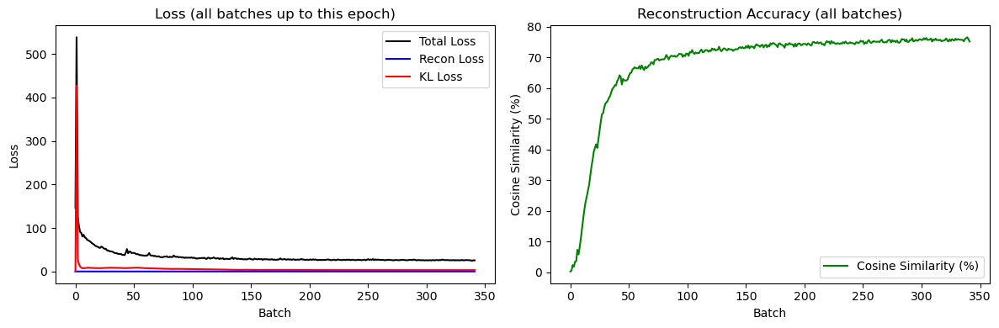

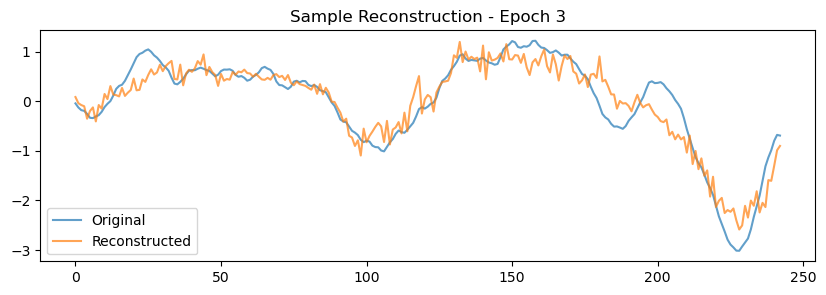


Epoch 4
  Batch 01 | Loss: 25.7407 | Recon: 0.0226 | KL: 3.149314 | CosSim Acc: 75.21%
  Batch 02 | Loss: 25.7221 | Recon: 0.0226 | KL: 3.140326 | CosSim Acc: 75.74%
  Batch 03 | Loss: 25.9987 | Recon: 0.0229 | KL: 3.112469 | CosSim Acc: 75.83%
  Batch 04 | Loss: 26.0239 | Recon: 0.0228 | KL: 3.229046 | CosSim Acc: 75.86%
  Batch 05 | Loss: 25.3692 | Recon: 0.0222 | KL: 3.151407 | CosSim Acc: 76.07%
  Batch 06 | Loss: 25.8671 | Recon: 0.0227 | KL: 3.124731 | CosSim Acc: 76.04%
  Batch 07 | Loss: 26.7386 | Recon: 0.0236 | KL: 3.138886 | CosSim Acc: 75.00%
  Batch 08 | Loss: 25.2647 | Recon: 0.0222 | KL: 3.107949 | CosSim Acc: 75.87%
  Batch 09 | Loss: 25.7636 | Recon: 0.0227 | KL: 3.068807 | CosSim Acc: 75.07%
  Batch 10 | Loss: 25.8189 | Recon: 0.0226 | KL: 3.171763 | CosSim Acc: 76.10%
  Batch 11 | Loss: 25.6313 | Recon: 0.0225 | KL: 3.126830 | CosSim Acc: 75.30%
  Batch 12 | Loss: 25.7376 | Recon: 0.0226 | KL: 3.130313 | CosSim Acc: 75.22%
  Batch 13 | Loss: 25.4619 | Recon: 0.0223 

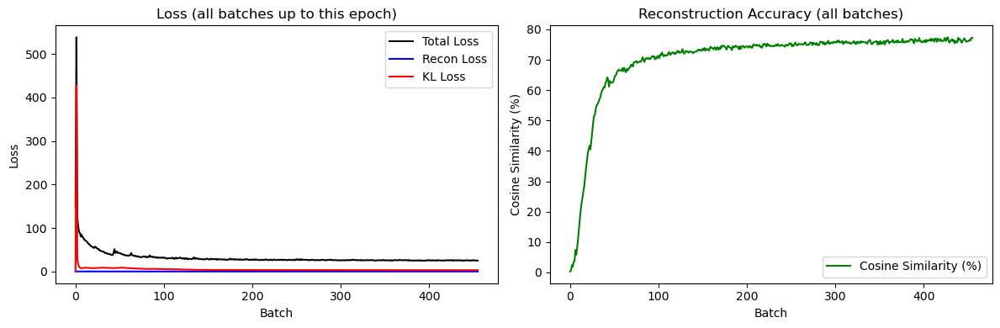

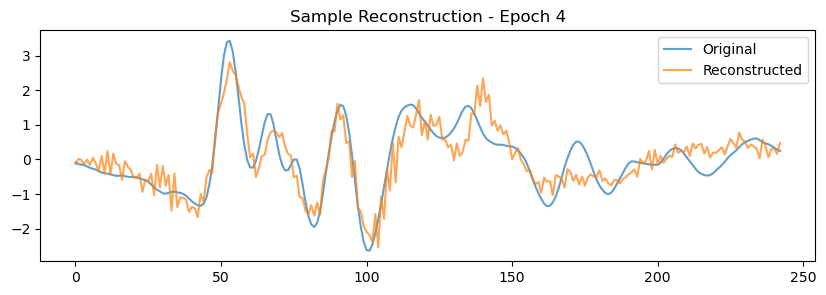


Epoch 5
  Batch 01 | Loss: 25.8357 | Recon: 0.0228 | KL: 3.025802 | CosSim Acc: 76.20%
  Batch 02 | Loss: 25.2618 | Recon: 0.0222 | KL: 3.062654 | CosSim Acc: 76.68%
  Batch 03 | Loss: 26.3913 | Recon: 0.0234 | KL: 3.022233 | CosSim Acc: 75.96%
  Batch 04 | Loss: 25.3448 | Recon: 0.0223 | KL: 3.039458 | CosSim Acc: 76.23%
  Batch 05 | Loss: 25.7048 | Recon: 0.0226 | KL: 3.085275 | CosSim Acc: 76.33%
  Batch 06 | Loss: 25.2801 | Recon: 0.0222 | KL: 3.055029 | CosSim Acc: 77.05%
  Batch 07 | Loss: 25.1875 | Recon: 0.0221 | KL: 3.053989 | CosSim Acc: 77.07%
  Batch 08 | Loss: 24.8140 | Recon: 0.0217 | KL: 3.091754 | CosSim Acc: 76.50%
  Batch 09 | Loss: 25.7647 | Recon: 0.0227 | KL: 3.092276 | CosSim Acc: 76.15%
  Batch 10 | Loss: 25.0693 | Recon: 0.0220 | KL: 3.077875 | CosSim Acc: 76.46%
  Batch 11 | Loss: 25.7011 | Recon: 0.0226 | KL: 3.080208 | CosSim Acc: 76.40%
  Batch 12 | Loss: 25.3659 | Recon: 0.0223 | KL: 3.087272 | CosSim Acc: 76.78%
  Batch 13 | Loss: 26.2647 | Recon: 0.0232 

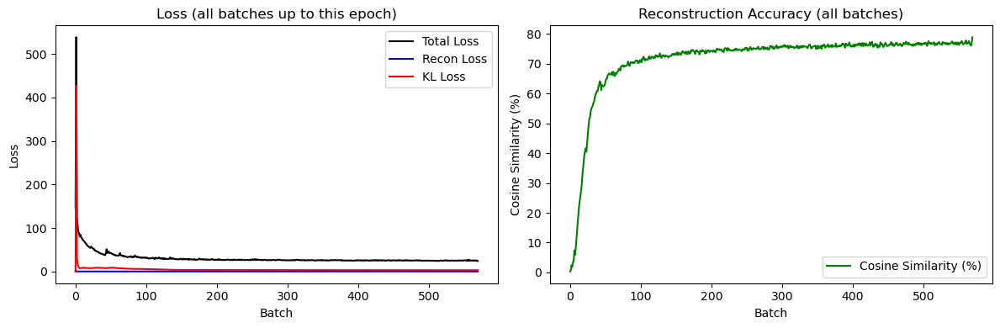

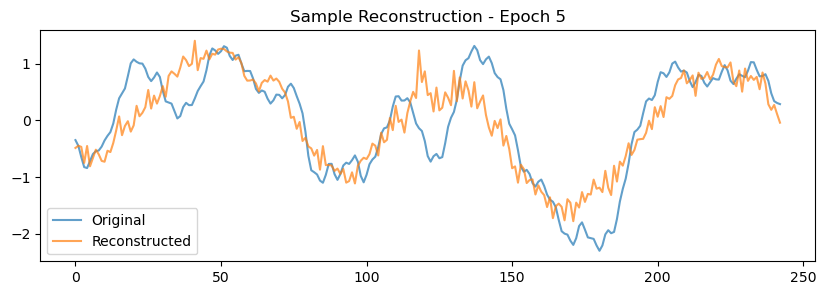


Epoch 6
  Batch 01 | Loss: 25.0401 | Recon: 0.0220 | KL: 3.086167 | CosSim Acc: 77.17%
  Batch 02 | Loss: 25.2667 | Recon: 0.0222 | KL: 3.090604 | CosSim Acc: 77.41%
  Batch 03 | Loss: 25.3847 | Recon: 0.0223 | KL: 3.050596 | CosSim Acc: 76.86%
  Batch 04 | Loss: 25.5527 | Recon: 0.0224 | KL: 3.112134 | CosSim Acc: 77.27%
  Batch 05 | Loss: 25.7122 | Recon: 0.0228 | KL: 2.938471 | CosSim Acc: 77.09%
  Batch 06 | Loss: 25.2752 | Recon: 0.0223 | KL: 2.981889 | CosSim Acc: 76.38%
  Batch 07 | Loss: 25.8127 | Recon: 0.0228 | KL: 3.051070 | CosSim Acc: 76.55%
  Batch 08 | Loss: 25.0426 | Recon: 0.0220 | KL: 3.002080 | CosSim Acc: 76.60%
  Batch 09 | Loss: 25.3824 | Recon: 0.0224 | KL: 2.963606 | CosSim Acc: 76.70%
  Batch 10 | Loss: 25.0068 | Recon: 0.0221 | KL: 2.917947 | CosSim Acc: 76.96%
  Batch 11 | Loss: 24.9235 | Recon: 0.0220 | KL: 2.947996 | CosSim Acc: 76.79%
  Batch 12 | Loss: 24.5761 | Recon: 0.0216 | KL: 3.002366 | CosSim Acc: 77.15%
  Batch 13 | Loss: 24.8897 | Recon: 0.0219 

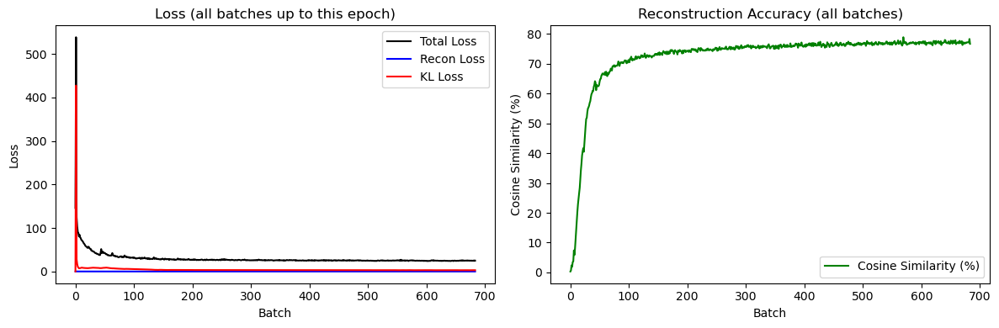

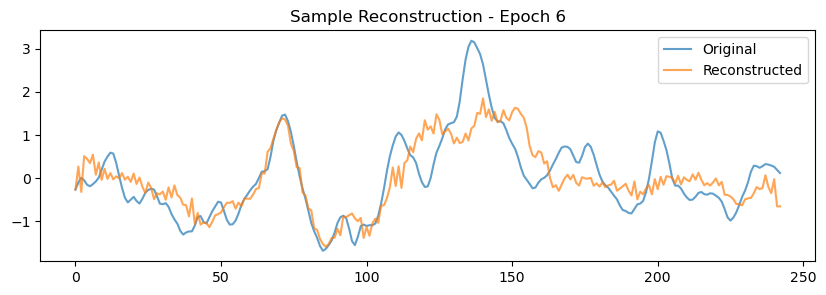


Epoch 7
  Batch 01 | Loss: 25.2155 | Recon: 0.0222 | KL: 3.026959 | CosSim Acc: 76.40%
  Batch 02 | Loss: 24.9916 | Recon: 0.0221 | KL: 2.936608 | CosSim Acc: 76.73%
  Batch 03 | Loss: 24.8431 | Recon: 0.0219 | KL: 2.965348 | CosSim Acc: 77.17%
  Batch 04 | Loss: 25.2363 | Recon: 0.0222 | KL: 3.008057 | CosSim Acc: 77.67%
  Batch 05 | Loss: 24.9862 | Recon: 0.0220 | KL: 2.985087 | CosSim Acc: 76.90%
  Batch 06 | Loss: 25.0191 | Recon: 0.0221 | KL: 2.946245 | CosSim Acc: 77.47%
  Batch 07 | Loss: 24.6319 | Recon: 0.0217 | KL: 2.891242 | CosSim Acc: 77.35%
  Batch 08 | Loss: 25.2031 | Recon: 0.0224 | KL: 2.830757 | CosSim Acc: 77.18%
  Batch 09 | Loss: 24.4327 | Recon: 0.0215 | KL: 2.909240 | CosSim Acc: 77.62%
  Batch 10 | Loss: 24.8958 | Recon: 0.0220 | KL: 2.904609 | CosSim Acc: 77.32%
  Batch 11 | Loss: 24.6777 | Recon: 0.0218 | KL: 2.911045 | CosSim Acc: 76.93%
  Batch 12 | Loss: 25.1804 | Recon: 0.0222 | KL: 2.939267 | CosSim Acc: 76.59%
  Batch 13 | Loss: 24.5618 | Recon: 0.0216 

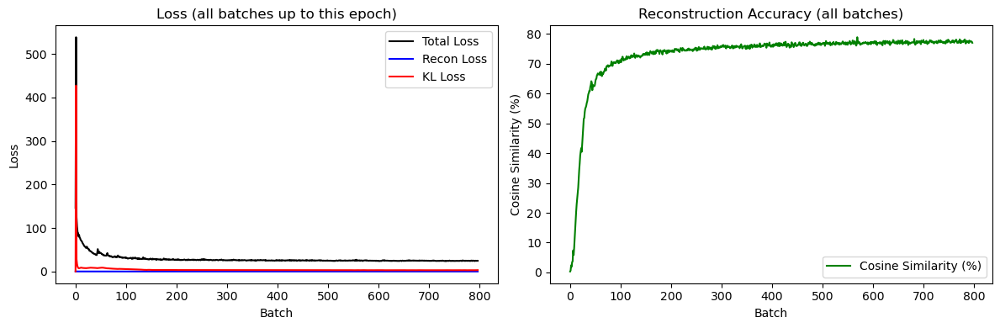

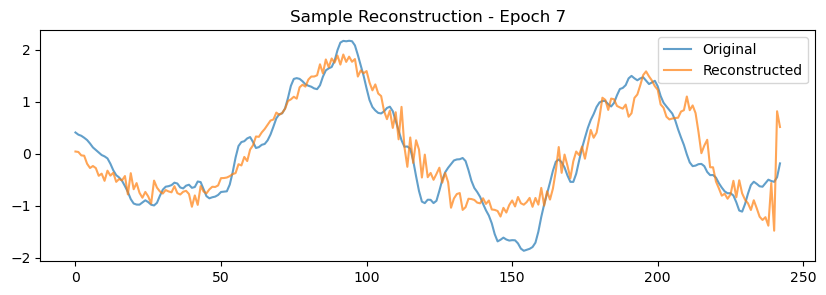


Epoch 8
  Batch 01 | Loss: 25.4012 | Recon: 0.0225 | KL: 2.895417 | CosSim Acc: 76.75%
  Batch 02 | Loss: 24.9533 | Recon: 0.0220 | KL: 2.907825 | CosSim Acc: 76.65%
  Batch 03 | Loss: 25.0465 | Recon: 0.0221 | KL: 2.901168 | CosSim Acc: 77.99%
  Batch 04 | Loss: 24.4043 | Recon: 0.0216 | KL: 2.843104 | CosSim Acc: 78.49%
  Batch 05 | Loss: 24.9361 | Recon: 0.0220 | KL: 2.947577 | CosSim Acc: 77.32%
  Batch 06 | Loss: 25.0071 | Recon: 0.0221 | KL: 2.859284 | CosSim Acc: 77.29%
  Batch 07 | Loss: 24.6454 | Recon: 0.0217 | KL: 2.915997 | CosSim Acc: 77.98%
  Batch 08 | Loss: 24.8325 | Recon: 0.0219 | KL: 2.924231 | CosSim Acc: 77.11%
  Batch 09 | Loss: 24.2191 | Recon: 0.0213 | KL: 2.885751 | CosSim Acc: 77.74%
  Batch 10 | Loss: 24.7918 | Recon: 0.0218 | KL: 2.946112 | CosSim Acc: 77.36%
  Batch 11 | Loss: 24.2223 | Recon: 0.0213 | KL: 2.883611 | CosSim Acc: 78.06%
  Batch 12 | Loss: 24.4488 | Recon: 0.0215 | KL: 2.924682 | CosSim Acc: 77.63%
  Batch 13 | Loss: 24.3991 | Recon: 0.0215 

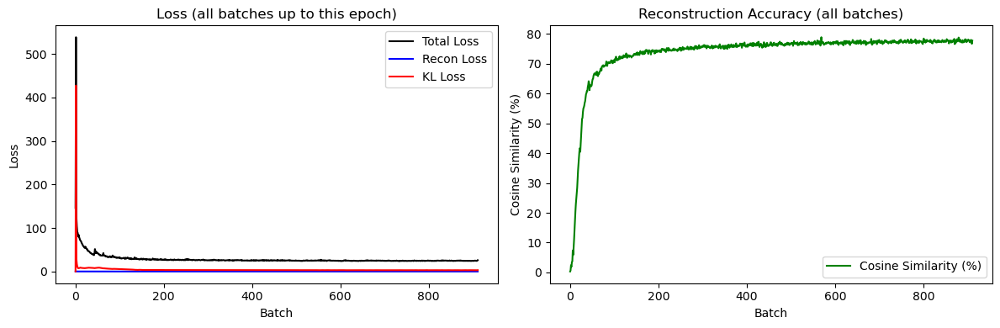

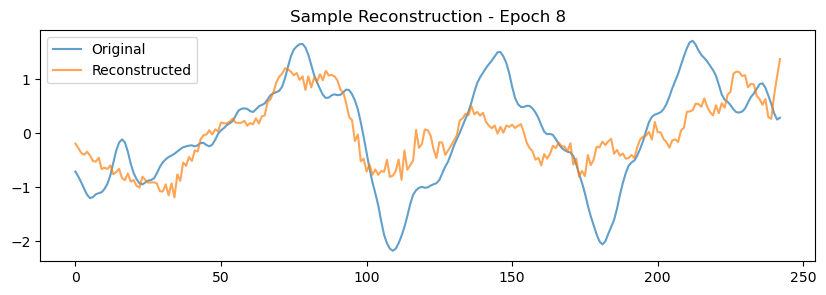


Epoch 9
  Batch 01 | Loss: 25.0639 | Recon: 0.0222 | KL: 2.846577 | CosSim Acc: 77.12%
  Batch 02 | Loss: 24.3548 | Recon: 0.0216 | KL: 2.789598 | CosSim Acc: 78.22%
  Batch 03 | Loss: 25.2399 | Recon: 0.0224 | KL: 2.859889 | CosSim Acc: 78.19%
  Batch 04 | Loss: 24.6768 | Recon: 0.0218 | KL: 2.872549 | CosSim Acc: 76.91%
  Batch 05 | Loss: 25.4329 | Recon: 0.0226 | KL: 2.873797 | CosSim Acc: 77.96%
  Batch 06 | Loss: 25.4862 | Recon: 0.0226 | KL: 2.908079 | CosSim Acc: 77.33%
  Batch 07 | Loss: 24.9199 | Recon: 0.0221 | KL: 2.851881 | CosSim Acc: 77.22%
  Batch 08 | Loss: 24.9828 | Recon: 0.0220 | KL: 3.013288 | CosSim Acc: 78.00%
  Batch 09 | Loss: 24.6362 | Recon: 0.0218 | KL: 2.881240 | CosSim Acc: 77.28%
  Batch 10 | Loss: 25.2026 | Recon: 0.0222 | KL: 2.965142 | CosSim Acc: 77.22%
  Batch 11 | Loss: 24.6814 | Recon: 0.0217 | KL: 3.020395 | CosSim Acc: 77.42%
  Batch 12 | Loss: 24.3642 | Recon: 0.0214 | KL: 2.972644 | CosSim Acc: 77.62%
  Batch 13 | Loss: 25.2652 | Recon: 0.0224 

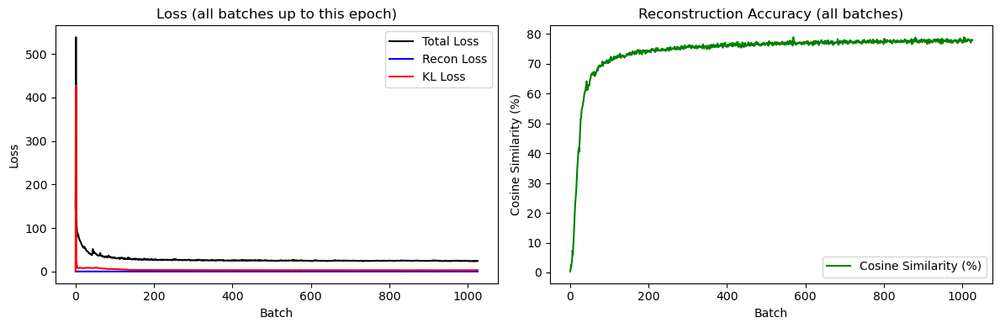

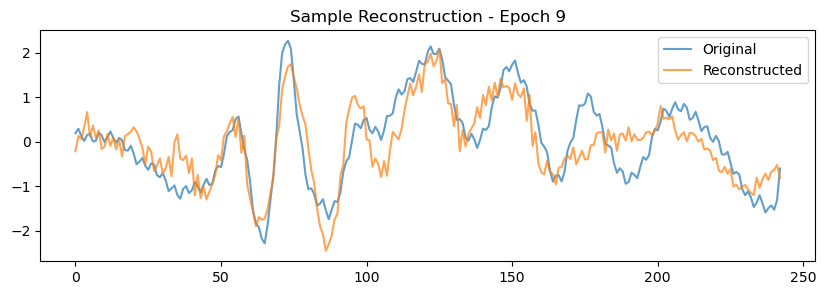


Epoch 10
  Batch 01 | Loss: 24.6658 | Recon: 0.0217 | KL: 2.994565 | CosSim Acc: 78.16%
  Batch 02 | Loss: 24.3628 | Recon: 0.0214 | KL: 2.974827 | CosSim Acc: 77.55%
  Batch 03 | Loss: 24.5603 | Recon: 0.0216 | KL: 2.947843 | CosSim Acc: 77.75%
  Batch 04 | Loss: 24.6167 | Recon: 0.0217 | KL: 2.947992 | CosSim Acc: 77.38%
  Batch 05 | Loss: 24.6088 | Recon: 0.0217 | KL: 2.901587 | CosSim Acc: 77.75%
  Batch 06 | Loss: 24.7440 | Recon: 0.0218 | KL: 2.920637 | CosSim Acc: 77.54%
  Batch 07 | Loss: 24.5467 | Recon: 0.0217 | KL: 2.846769 | CosSim Acc: 77.73%
  Batch 08 | Loss: 25.0244 | Recon: 0.0221 | KL: 2.882819 | CosSim Acc: 77.56%
  Batch 09 | Loss: 24.3372 | Recon: 0.0215 | KL: 2.883988 | CosSim Acc: 78.04%
  Batch 10 | Loss: 24.3619 | Recon: 0.0215 | KL: 2.812488 | CosSim Acc: 78.16%
  Batch 11 | Loss: 24.4834 | Recon: 0.0216 | KL: 2.877871 | CosSim Acc: 77.88%
  Batch 12 | Loss: 24.3873 | Recon: 0.0214 | KL: 2.972705 | CosSim Acc: 77.62%
  Batch 13 | Loss: 24.8332 | Recon: 0.0220

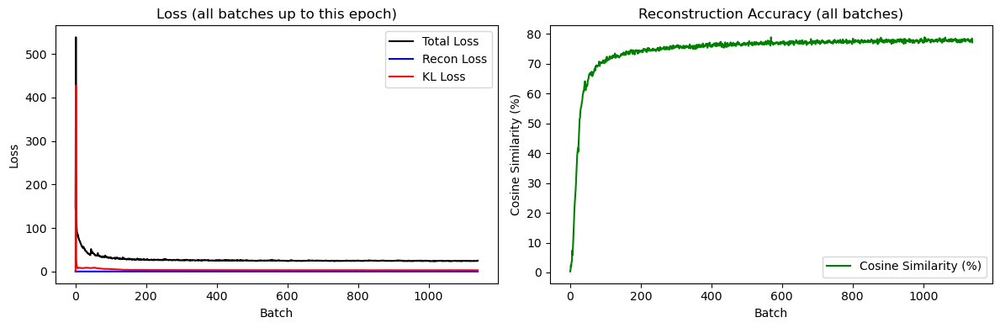

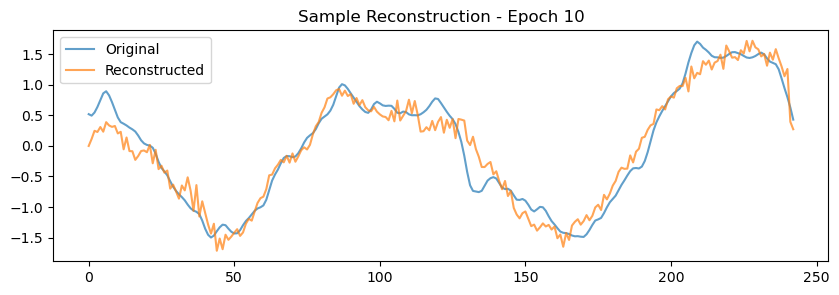


Epoch 11
  Batch 01 | Loss: 24.2711 | Recon: 0.0213 | KL: 2.924195 | CosSim Acc: 78.12%
  Batch 02 | Loss: 23.9822 | Recon: 0.0210 | KL: 2.996629 | CosSim Acc: 78.26%
  Batch 03 | Loss: 24.2503 | Recon: 0.0212 | KL: 3.043026 | CosSim Acc: 78.55%
  Batch 04 | Loss: 24.1903 | Recon: 0.0212 | KL: 2.944803 | CosSim Acc: 78.45%
  Batch 05 | Loss: 24.6137 | Recon: 0.0216 | KL: 2.973623 | CosSim Acc: 77.35%
  Batch 06 | Loss: 24.2741 | Recon: 0.0213 | KL: 2.963232 | CosSim Acc: 77.57%
  Batch 07 | Loss: 24.7405 | Recon: 0.0217 | KL: 2.999520 | CosSim Acc: 76.95%
  Batch 08 | Loss: 24.2477 | Recon: 0.0213 | KL: 2.912855 | CosSim Acc: 77.52%
  Batch 09 | Loss: 24.4580 | Recon: 0.0216 | KL: 2.853391 | CosSim Acc: 77.53%
  Batch 10 | Loss: 23.9730 | Recon: 0.0211 | KL: 2.831520 | CosSim Acc: 78.36%
  Batch 11 | Loss: 24.0433 | Recon: 0.0212 | KL: 2.853037 | CosSim Acc: 78.34%
  Batch 12 | Loss: 24.3656 | Recon: 0.0214 | KL: 2.963746 | CosSim Acc: 77.69%
  Batch 13 | Loss: 24.1960 | Recon: 0.0212

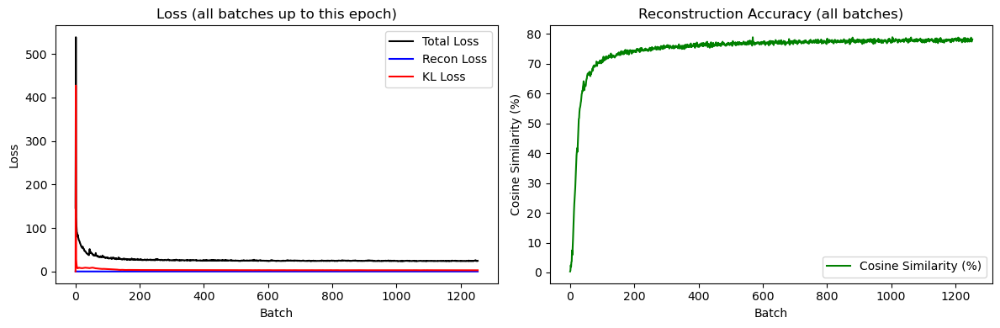

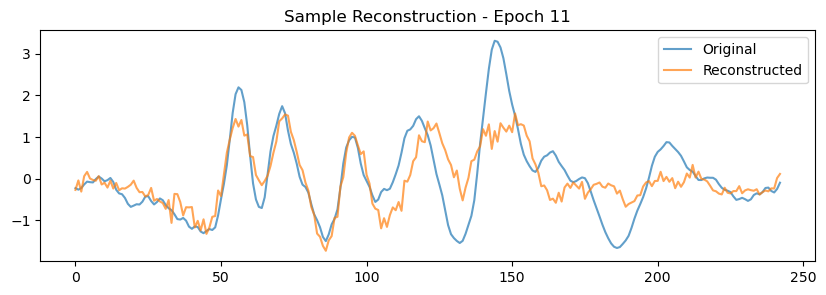


Epoch 12
  Batch 01 | Loss: 24.1795 | Recon: 0.0213 | KL: 2.897475 | CosSim Acc: 77.73%
  Batch 02 | Loss: 24.4026 | Recon: 0.0215 | KL: 2.947103 | CosSim Acc: 78.07%
  Batch 03 | Loss: 24.3183 | Recon: 0.0213 | KL: 3.001098 | CosSim Acc: 77.92%
  Batch 04 | Loss: 24.1853 | Recon: 0.0212 | KL: 3.021349 | CosSim Acc: 78.23%
  Batch 05 | Loss: 24.1506 | Recon: 0.0212 | KL: 2.995535 | CosSim Acc: 78.15%
  Batch 06 | Loss: 24.0588 | Recon: 0.0211 | KL: 2.951838 | CosSim Acc: 77.85%
  Batch 07 | Loss: 24.0484 | Recon: 0.0211 | KL: 2.974576 | CosSim Acc: 78.02%
  Batch 08 | Loss: 24.0458 | Recon: 0.0211 | KL: 2.966684 | CosSim Acc: 78.37%
  Batch 09 | Loss: 24.0171 | Recon: 0.0210 | KL: 2.988770 | CosSim Acc: 78.13%
  Batch 10 | Loss: 23.6317 | Recon: 0.0206 | KL: 3.027470 | CosSim Acc: 78.52%
  Batch 11 | Loss: 24.6042 | Recon: 0.0217 | KL: 2.889849 | CosSim Acc: 77.90%
  Batch 12 | Loss: 23.6997 | Recon: 0.0208 | KL: 2.938949 | CosSim Acc: 78.74%
  Batch 13 | Loss: 23.7839 | Recon: 0.0209

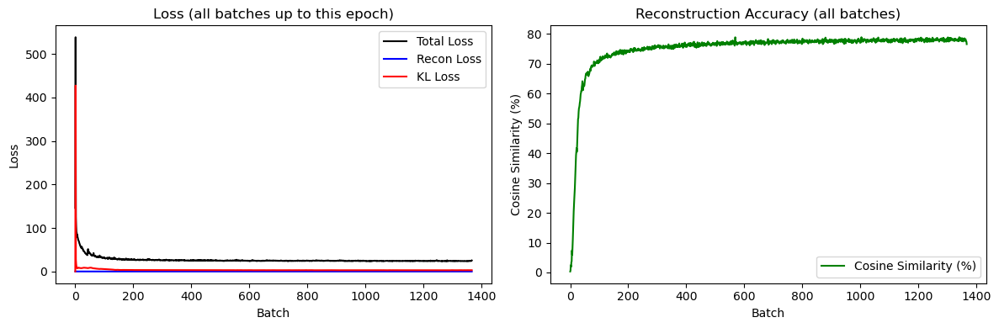

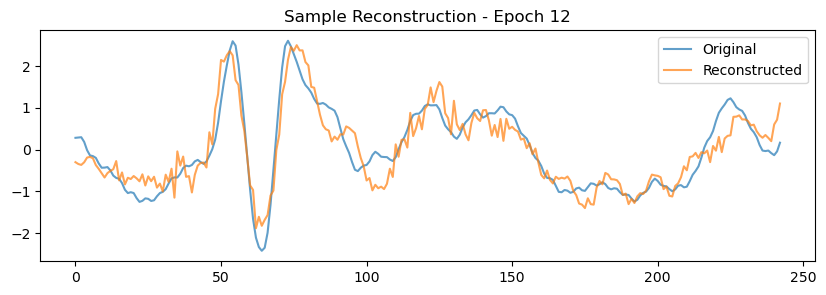


Epoch 13
  Batch 01 | Loss: 24.7173 | Recon: 0.0218 | KL: 2.906926 | CosSim Acc: 77.82%
  Batch 02 | Loss: 24.1034 | Recon: 0.0212 | KL: 2.940209 | CosSim Acc: 77.95%
  Batch 03 | Loss: 24.6830 | Recon: 0.0217 | KL: 2.941830 | CosSim Acc: 78.25%
  Batch 04 | Loss: 23.7497 | Recon: 0.0208 | KL: 2.947288 | CosSim Acc: 78.39%
  Batch 05 | Loss: 24.2009 | Recon: 0.0212 | KL: 2.956499 | CosSim Acc: 78.69%
  Batch 06 | Loss: 23.3149 | Recon: 0.0204 | KL: 2.934843 | CosSim Acc: 78.80%
  Batch 07 | Loss: 24.3238 | Recon: 0.0214 | KL: 2.971916 | CosSim Acc: 77.85%
  Batch 08 | Loss: 24.2517 | Recon: 0.0214 | KL: 2.884523 | CosSim Acc: 78.02%
  Batch 09 | Loss: 23.9023 | Recon: 0.0209 | KL: 2.959035 | CosSim Acc: 77.97%
  Batch 10 | Loss: 23.9790 | Recon: 0.0210 | KL: 2.977598 | CosSim Acc: 78.37%
  Batch 11 | Loss: 23.9253 | Recon: 0.0209 | KL: 3.024232 | CosSim Acc: 78.02%
  Batch 12 | Loss: 24.6371 | Recon: 0.0217 | KL: 2.939689 | CosSim Acc: 78.13%
  Batch 13 | Loss: 24.4576 | Recon: 0.0216

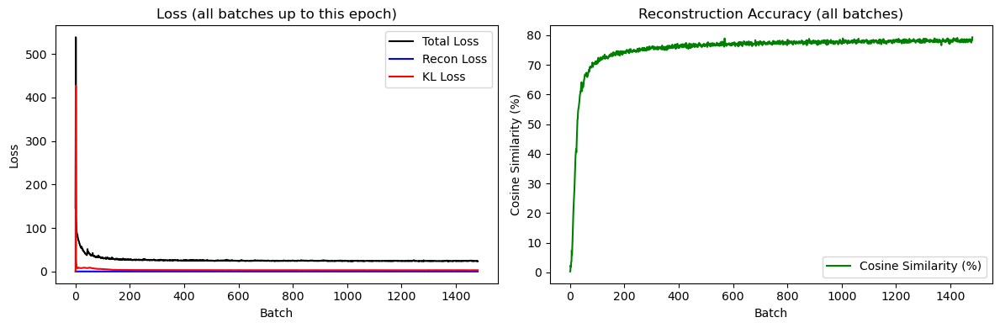

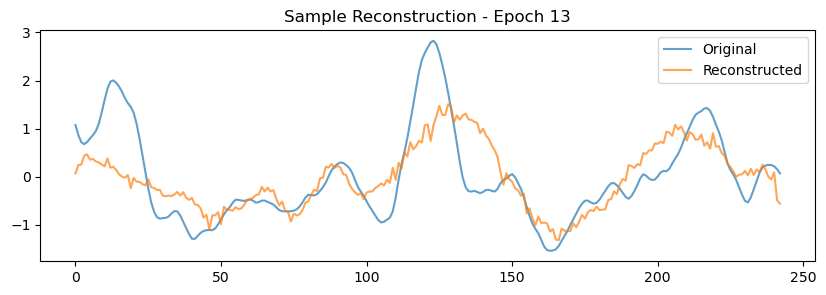


Epoch 14
  Batch 01 | Loss: 24.0562 | Recon: 0.0211 | KL: 2.908968 | CosSim Acc: 78.10%
  Batch 02 | Loss: 23.7075 | Recon: 0.0208 | KL: 2.949591 | CosSim Acc: 78.60%
  Batch 03 | Loss: 24.0100 | Recon: 0.0211 | KL: 2.937396 | CosSim Acc: 78.12%
  Batch 04 | Loss: 23.8790 | Recon: 0.0209 | KL: 3.002340 | CosSim Acc: 78.24%
  Batch 05 | Loss: 24.2227 | Recon: 0.0213 | KL: 2.950120 | CosSim Acc: 77.98%
  Batch 06 | Loss: 24.0603 | Recon: 0.0211 | KL: 2.944488 | CosSim Acc: 77.93%
  Batch 07 | Loss: 24.3211 | Recon: 0.0214 | KL: 2.951079 | CosSim Acc: 78.03%
  Batch 08 | Loss: 24.2908 | Recon: 0.0213 | KL: 2.982945 | CosSim Acc: 78.01%
  Batch 09 | Loss: 23.9139 | Recon: 0.0209 | KL: 3.041027 | CosSim Acc: 78.24%
  Batch 10 | Loss: 23.7143 | Recon: 0.0207 | KL: 2.977039 | CosSim Acc: 78.22%
  Batch 11 | Loss: 23.8768 | Recon: 0.0210 | KL: 2.912739 | CosSim Acc: 78.51%
  Batch 12 | Loss: 23.3827 | Recon: 0.0205 | KL: 2.920426 | CosSim Acc: 79.14%
  Batch 13 | Loss: 23.6451 | Recon: 0.0208

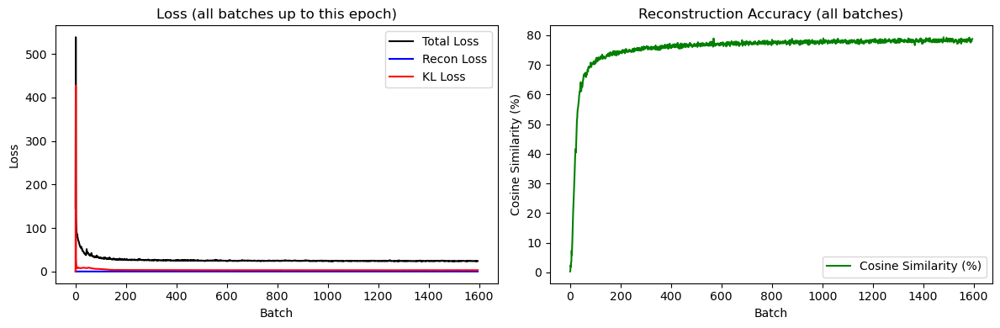

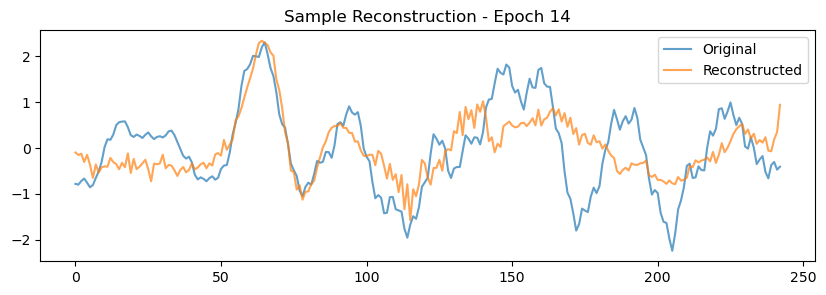


Epoch 15
  Batch 01 | Loss: 23.7897 | Recon: 0.0209 | KL: 2.937258 | CosSim Acc: 78.64%
  Batch 02 | Loss: 24.4376 | Recon: 0.0215 | KL: 2.896621 | CosSim Acc: 78.08%
  Batch 03 | Loss: 23.8343 | Recon: 0.0210 | KL: 2.873947 | CosSim Acc: 78.34%
  Batch 04 | Loss: 23.5770 | Recon: 0.0207 | KL: 2.923145 | CosSim Acc: 78.64%
  Batch 05 | Loss: 24.0592 | Recon: 0.0211 | KL: 2.927455 | CosSim Acc: 78.03%
  Batch 06 | Loss: 23.8124 | Recon: 0.0209 | KL: 2.892351 | CosSim Acc: 78.33%
  Batch 07 | Loss: 23.7894 | Recon: 0.0208 | KL: 3.024060 | CosSim Acc: 78.60%
  Batch 08 | Loss: 24.0180 | Recon: 0.0210 | KL: 2.996417 | CosSim Acc: 78.07%
  Batch 09 | Loss: 23.6337 | Recon: 0.0207 | KL: 2.970632 | CosSim Acc: 78.61%
  Batch 10 | Loss: 24.0392 | Recon: 0.0211 | KL: 2.978832 | CosSim Acc: 78.31%
  Batch 11 | Loss: 24.0500 | Recon: 0.0210 | KL: 3.012363 | CosSim Acc: 77.61%
  Batch 12 | Loss: 23.9793 | Recon: 0.0210 | KL: 2.958179 | CosSim Acc: 78.29%
  Batch 13 | Loss: 23.4725 | Recon: 0.0205

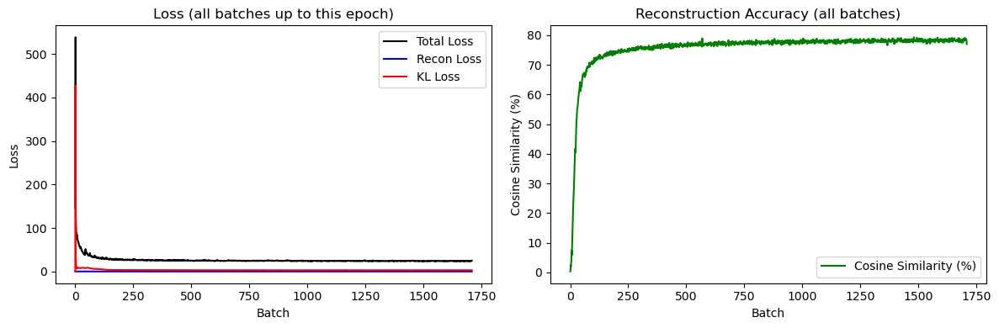

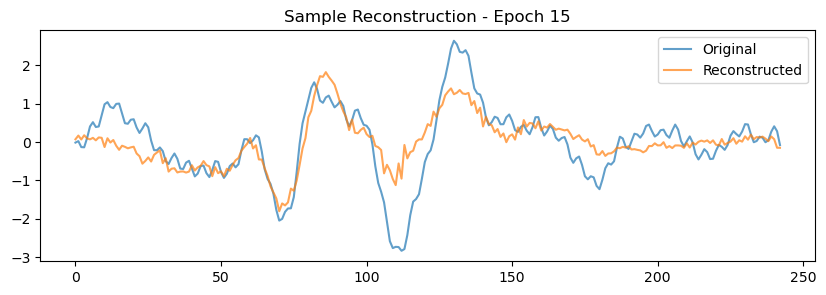


Epoch 16
  Batch 01 | Loss: 23.9120 | Recon: 0.0211 | KL: 2.826073 | CosSim Acc: 78.29%
  Batch 02 | Loss: 23.4618 | Recon: 0.0206 | KL: 2.816982 | CosSim Acc: 78.74%
  Batch 03 | Loss: 23.4255 | Recon: 0.0205 | KL: 2.906977 | CosSim Acc: 78.72%
  Batch 04 | Loss: 23.8646 | Recon: 0.0209 | KL: 2.998210 | CosSim Acc: 78.30%
  Batch 05 | Loss: 23.6445 | Recon: 0.0206 | KL: 3.004573 | CosSim Acc: 78.36%
  Batch 06 | Loss: 23.8945 | Recon: 0.0209 | KL: 3.030320 | CosSim Acc: 77.81%
  Batch 07 | Loss: 23.9801 | Recon: 0.0210 | KL: 2.990592 | CosSim Acc: 78.75%
  Batch 08 | Loss: 23.9862 | Recon: 0.0210 | KL: 2.995501 | CosSim Acc: 78.16%
  Batch 09 | Loss: 23.9626 | Recon: 0.0210 | KL: 2.994744 | CosSim Acc: 78.37%
  Batch 10 | Loss: 24.0272 | Recon: 0.0210 | KL: 3.012814 | CosSim Acc: 77.89%
  Batch 11 | Loss: 24.0199 | Recon: 0.0211 | KL: 2.872661 | CosSim Acc: 78.17%
  Batch 12 | Loss: 24.0153 | Recon: 0.0212 | KL: 2.860685 | CosSim Acc: 78.54%
  Batch 13 | Loss: 23.5441 | Recon: 0.0208

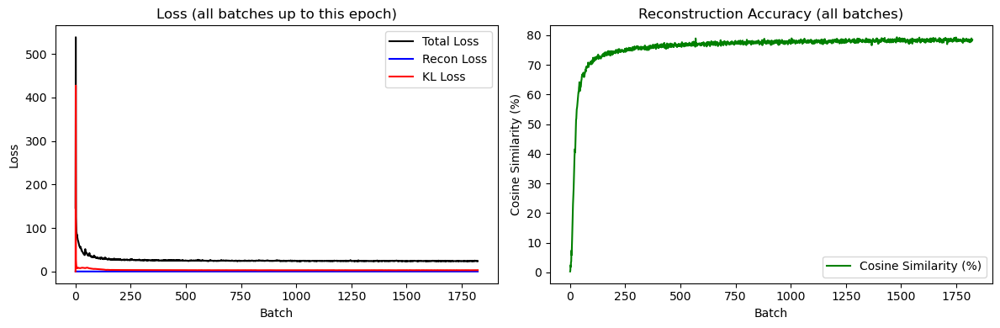

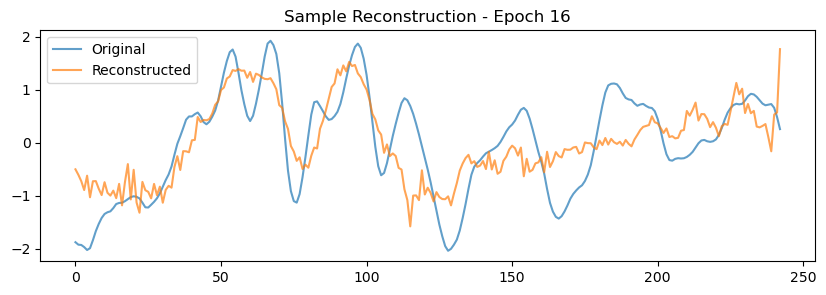


Epoch 17
  Batch 01 | Loss: 25.3936 | Recon: 0.0225 | KL: 2.882317 | CosSim Acc: 77.93%
  Batch 02 | Loss: 24.4835 | Recon: 0.0215 | KL: 2.939650 | CosSim Acc: 78.05%
  Batch 03 | Loss: 24.5019 | Recon: 0.0216 | KL: 2.877902 | CosSim Acc: 78.63%
  Batch 04 | Loss: 24.2217 | Recon: 0.0213 | KL: 2.900997 | CosSim Acc: 78.57%
  Batch 05 | Loss: 24.0438 | Recon: 0.0212 | KL: 2.814167 | CosSim Acc: 78.28%
  Batch 06 | Loss: 24.1925 | Recon: 0.0213 | KL: 2.848639 | CosSim Acc: 78.40%
  Batch 07 | Loss: 24.2558 | Recon: 0.0214 | KL: 2.904002 | CosSim Acc: 78.40%
  Batch 08 | Loss: 24.1705 | Recon: 0.0212 | KL: 2.972811 | CosSim Acc: 78.17%
  Batch 09 | Loss: 24.1829 | Recon: 0.0212 | KL: 2.993885 | CosSim Acc: 78.46%
  Batch 10 | Loss: 24.1996 | Recon: 0.0212 | KL: 3.005406 | CosSim Acc: 78.31%
  Batch 11 | Loss: 24.1114 | Recon: 0.0211 | KL: 3.037353 | CosSim Acc: 78.28%
  Batch 12 | Loss: 23.8236 | Recon: 0.0209 | KL: 2.891892 | CosSim Acc: 78.87%
  Batch 13 | Loss: 23.5225 | Recon: 0.0206

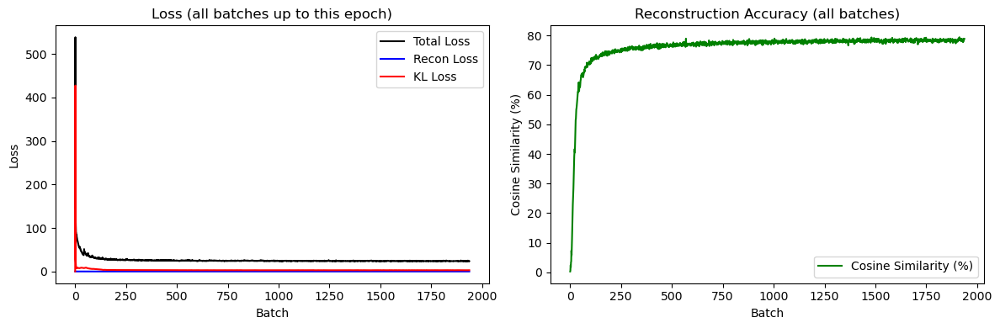

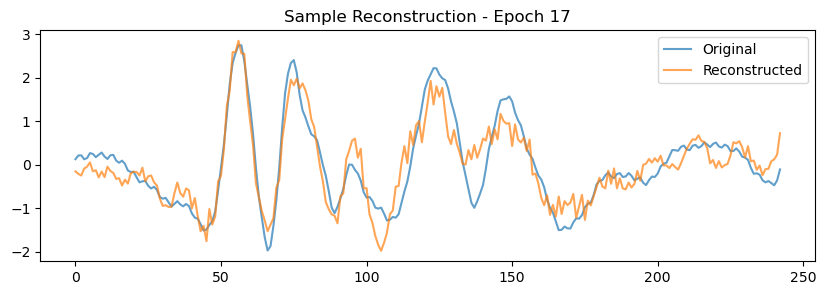


Epoch 18
  Batch 01 | Loss: 24.3074 | Recon: 0.0214 | KL: 2.915928 | CosSim Acc: 78.39%
  Batch 02 | Loss: 23.4476 | Recon: 0.0205 | KL: 2.905723 | CosSim Acc: 79.29%
  Batch 03 | Loss: 23.8243 | Recon: 0.0210 | KL: 2.862408 | CosSim Acc: 78.41%
  Batch 04 | Loss: 24.0704 | Recon: 0.0212 | KL: 2.831404 | CosSim Acc: 78.48%
  Batch 05 | Loss: 23.7932 | Recon: 0.0209 | KL: 2.846102 | CosSim Acc: 78.33%
  Batch 06 | Loss: 24.1338 | Recon: 0.0210 | KL: 3.085564 | CosSim Acc: 77.92%
  Batch 07 | Loss: 23.3519 | Recon: 0.0204 | KL: 2.956241 | CosSim Acc: 79.21%
  Batch 08 | Loss: 23.8267 | Recon: 0.0208 | KL: 3.055792 | CosSim Acc: 79.23%
  Batch 09 | Loss: 23.6024 | Recon: 0.0206 | KL: 3.000529 | CosSim Acc: 78.95%
  Batch 10 | Loss: 24.2860 | Recon: 0.0214 | KL: 2.903276 | CosSim Acc: 78.17%
  Batch 11 | Loss: 23.7808 | Recon: 0.0209 | KL: 2.920071 | CosSim Acc: 78.80%
  Batch 12 | Loss: 23.5020 | Recon: 0.0206 | KL: 2.919927 | CosSim Acc: 79.24%
  Batch 13 | Loss: 23.7055 | Recon: 0.0207

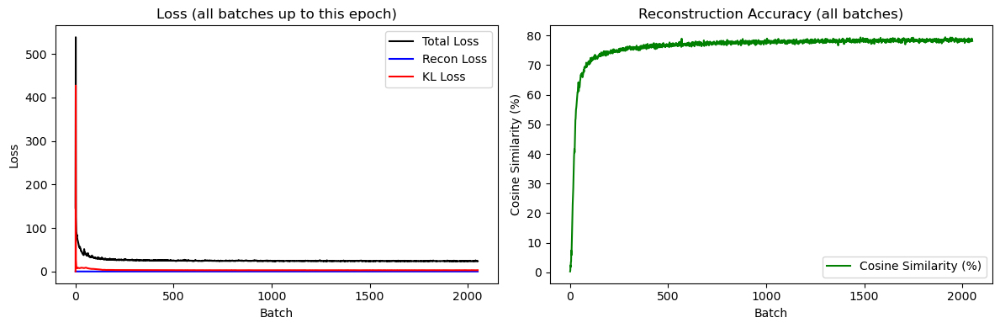

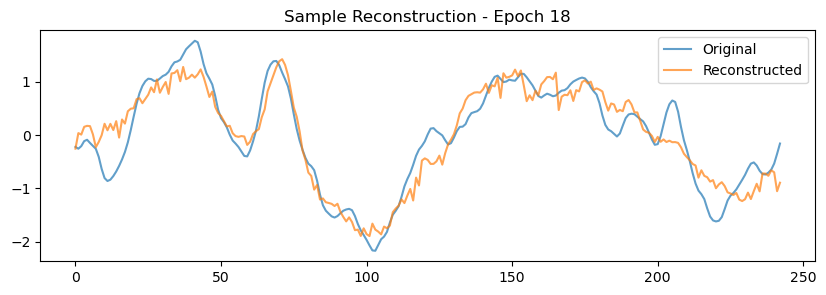


Epoch 19
  Batch 01 | Loss: 24.0792 | Recon: 0.0213 | KL: 2.816518 | CosSim Acc: 77.81%
  Batch 02 | Loss: 23.9714 | Recon: 0.0211 | KL: 2.858044 | CosSim Acc: 78.20%
  Batch 03 | Loss: 24.9157 | Recon: 0.0220 | KL: 2.888239 | CosSim Acc: 78.71%
  Batch 04 | Loss: 23.2128 | Recon: 0.0204 | KL: 2.833360 | CosSim Acc: 79.26%
  Batch 05 | Loss: 24.7308 | Recon: 0.0217 | KL: 3.021022 | CosSim Acc: 77.59%
  Batch 06 | Loss: 24.2407 | Recon: 0.0213 | KL: 2.975621 | CosSim Acc: 78.24%
  Batch 07 | Loss: 23.9930 | Recon: 0.0211 | KL: 2.915510 | CosSim Acc: 78.64%
  Batch 08 | Loss: 24.5667 | Recon: 0.0217 | KL: 2.875283 | CosSim Acc: 78.20%
  Batch 09 | Loss: 24.7290 | Recon: 0.0218 | KL: 2.894024 | CosSim Acc: 78.39%
  Batch 10 | Loss: 23.7634 | Recon: 0.0208 | KL: 2.928278 | CosSim Acc: 78.90%
  Batch 11 | Loss: 23.9412 | Recon: 0.0210 | KL: 2.926211 | CosSim Acc: 78.77%
  Batch 12 | Loss: 24.2305 | Recon: 0.0214 | KL: 2.856747 | CosSim Acc: 77.47%
  Batch 13 | Loss: 24.0269 | Recon: 0.0212

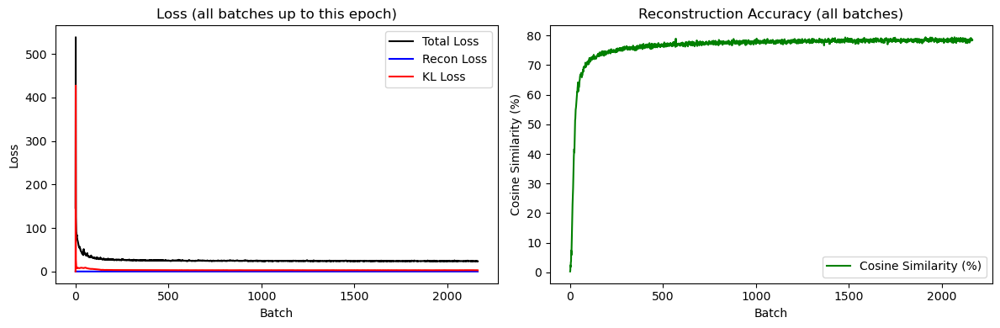

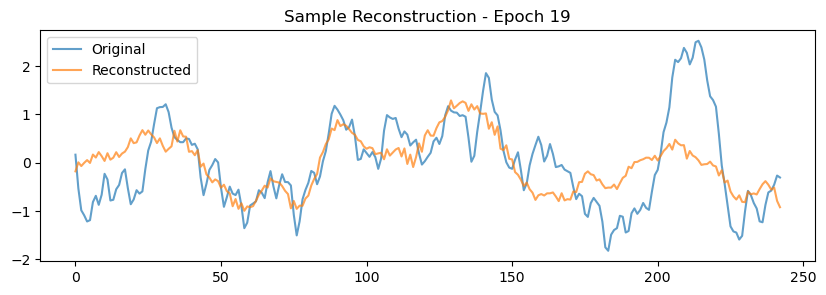


Epoch 20
  Batch 01 | Loss: 23.8374 | Recon: 0.0208 | KL: 3.003677 | CosSim Acc: 78.30%
  Batch 02 | Loss: 23.9800 | Recon: 0.0209 | KL: 3.097718 | CosSim Acc: 78.25%
  Batch 03 | Loss: 23.9199 | Recon: 0.0209 | KL: 3.020460 | CosSim Acc: 77.76%
  Batch 04 | Loss: 23.6689 | Recon: 0.0207 | KL: 2.942013 | CosSim Acc: 78.50%
  Batch 05 | Loss: 23.9592 | Recon: 0.0210 | KL: 2.983436 | CosSim Acc: 78.17%
  Batch 06 | Loss: 24.3996 | Recon: 0.0215 | KL: 2.883880 | CosSim Acc: 77.98%
  Batch 07 | Loss: 24.0341 | Recon: 0.0212 | KL: 2.852587 | CosSim Acc: 78.21%
  Batch 08 | Loss: 24.0826 | Recon: 0.0212 | KL: 2.863382 | CosSim Acc: 78.46%
  Batch 09 | Loss: 23.8069 | Recon: 0.0210 | KL: 2.795312 | CosSim Acc: 78.11%
  Batch 10 | Loss: 23.7861 | Recon: 0.0209 | KL: 2.928182 | CosSim Acc: 78.15%
  Batch 11 | Loss: 23.9713 | Recon: 0.0210 | KL: 2.939134 | CosSim Acc: 78.06%
  Batch 12 | Loss: 23.8767 | Recon: 0.0209 | KL: 2.983150 | CosSim Acc: 78.34%
  Batch 13 | Loss: 23.5143 | Recon: 0.0205

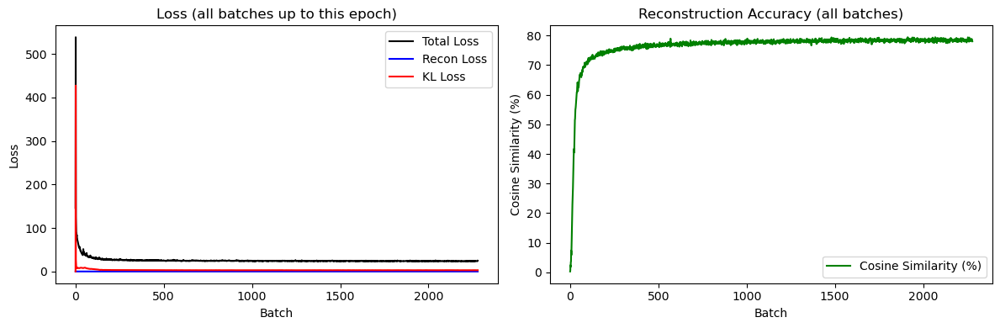

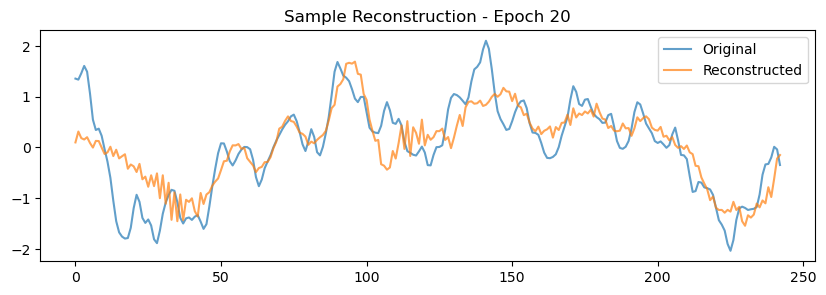

In [7]:
import torch
import matplotlib.pyplot as plt
import random

device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = Conv1DVAE().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-2)

# Persistent logs
all_total_losses = []
all_recon_losses = []
all_kl_losses = []
all_accs = []

for epoch in range(20):
    model.train()
    total_loss = total_recon = total_kl = 0

    print(f"\nEpoch {epoch+1}")
    for i, (x_batch, y_batch, flag_batch) in enumerate(dataloader):
        x_batch = x_batch.to(device)
        y_batch = y_batch.to(device)

        optimizer.zero_grad()
        recon_batch, mu, logvar = model(x_batch)
        loss, recon, kl = vae_loss_function(recon_batch, y_batch, mu, logvar)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        total_recon += recon.item()
        total_kl += kl.item()

        with torch.no_grad():
            cos = torch.nn.functional.cosine_similarity(recon_batch, y_batch, dim=1)
            accuracy = torch.mean(cos).item() * 100  # % cosine similarity

        # Store full training history
        all_total_losses.append(loss.item())
        all_recon_losses.append(recon.item())
        all_kl_losses.append(kl.item())
        all_accs.append(accuracy)

        print(f"  Batch {i+1:02d} | Loss: {loss.item():.4f} | Recon: {recon.item():.4f} | KL: {kl.item():.6f} | CosSim Acc: {accuracy:.2f}%")

    print(f"Epoch Summary -> Total: {total_loss:.4f} | Recon: {total_recon:.4f} | KL: {total_kl:.6f}")

    # === Plot full training history (losses & accuracy so far) ===
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))

    axs[0].plot(all_total_losses, label='Total Loss', color='black')
    axs[0].plot(all_recon_losses, label='Recon Loss', color='blue')
    axs[0].plot(all_kl_losses, label='KL Loss', color='red')
    axs[0].set_title("Loss (all batches up to this epoch)")
    axs[0].set_xlabel("Batch")
    axs[0].set_ylabel("Loss")
    axs[0].legend()

    axs[1].plot(all_accs, label='Cosine Similarity (%)', color='green')
    axs[1].set_title("Reconstruction Accuracy (all batches)")
    axs[1].set_xlabel("Batch")
    axs[1].set_ylabel("Cosine Similarity (%)")
    axs[1].legend()

    plt.tight_layout()
    plt.show()

    # === Plot original vs reconstructed waveform (1 sample) ===
    model.eval()
    with torch.no_grad():
        idx = random.randint(0, len(x_batch) - 1)
        original = y_batch[idx].cpu().numpy()
        reconstructed = recon_batch[idx].cpu().numpy()

        plt.figure(figsize=(10, 3))
        plt.plot(original, label="Original", alpha=0.7)
        plt.plot(reconstructed, label="Reconstructed", alpha=0.7)
        plt.title(f"Sample Reconstruction - Epoch {epoch+1}")
        plt.legend()
        plt.show()


In [ ]:
model_path = 'conv1d_vae_model_2.pth'
torch.save(model.state_dict(), model_path)
# Save the model
print(f"Model saved to {model_path}")

Model saved to conv1d_vae_model_1.pth


# Trying the model on unmeaned data

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.decomposition import TruncatedSVD
from cftsdata import abr 
from pathlib import Path
import os
from skfda import FDataGrid
from skfda.preprocessing.dim_reduction.projection import FPCA
from skfda.exploratory.visualization import FPCAPlot

/var/folders/1g/bksky7bd2wb927qzgc2fqjhc0000gn/T/ipykernel_1826/3570265402.py:10: DeprecationWarning: The module "projection" is deprecated. Please use "dim_reduction"
  from skfda.preprocessing.dim_reduction.projection import FPCA


In [10]:
mouse_id = 186
time_point = 0 
ear = 'right'
frequency = 4000

In [11]:
# path to the data file
filename = Path(f'../../../../data/practicum-data/ABRpresto data/ABRpresto data/Mouse{mouse_id}_timepoint{time_point}_{ear} abr_io').absolute()
print(f'Loading {filename}')

fh = abr.load(filename)
epochs = fh.get_epochs_filtered()

Loading /Users/peeyushpatel/Desktop/Practicum/Practicum-work/Notebooks/../../../../data/practicum-data/ABRpresto data/ABRpresto data/Mouse186_timepoint0_right abr_io


In [12]:
def extract_data(mouse_id=114, time_point=0, ear='right'):
    """
    Extracts the epochs and thresholds for a given mouse, timepoint and ear.
    """
    # path to the data file
    filename = Path(f'../../../../data/practicum-data/ABRpresto data/ABRpresto data/Mouse{mouse_id}_timepoint{time_point}_{ear} abr_io').absolute()
    print(f'Loading {filename}')

    fh = abr.load(filename)
    ep = fh.get_epochs_filtered()

    # extract thresholds and frequency pair for same mouse, timepoint and ear 
    th = thresholds[(thresholds['id'] == mouse_id) & (thresholds['timepoint'] == time_point) & (thresholds['ear'] == ear)][['frequency', 'manual threshold']]
    # th = thresholds[(thresholds['id'] == mouse_id) & (thresholds['timepoint'] == time_point) & (thresholds['ear'] == ear)]['frequency', 'manual threshold']
    return ep, th

In [13]:
abr_data, abr_thresholds = extract_data(mouse_id, time_point, ear)

Loading /Users/peeyushpatel/Desktop/Practicum/Practicum-work/Notebooks/../../../../data/practicum-data/ABRpresto data/ABRpresto data/Mouse186_timepoint0_right abr_io


In [14]:
def abr_list_for_freq(abr_data, abr_thresholds, frequency=4000):
    """
    Extracts the ABR data for a given
    frequency from the abr_data and abr_thresholds
    """
    abr_data_group = abr_data.groupby(['frequency', 'level'])
    abr_list = []
    th = abr_thresholds[abr_thresholds['frequency'] == frequency]['manual threshold'].values[0]
    for (freq, level), group in abr_data_group:
        if freq == frequency:  # Your target frequency
            #Append the group and level to the list
            abr_list.append((group.values, level))
    return abr_list, th

def plot_abr_for_freq(abr_data, abr_thresholds, frequency=4000):
    """
    Plots the ABR data for a given frequency
    """
    abr_list, th = abr_list_for_freq(abr_data, abr_thresholds, frequency)
    print(f'Threshold for {frequency} Hz is {th} dB')
    #Plot the ABR data
    for abr_wave, level in abr_list:
        plt.figure(figsize=(12, 10))
        mean = np.mean(abr_wave, axis=0)
        for i, row in enumerate(abr_wave):
            # Plot the waveforms for one level on top of each other
            plt.plot(row)
            plt.title(f'ABR waveforms for {level} dB')
            plt.xlabel('Time')
            plt.ylabel('Amplitude')
        # Plot the mean waveform
        plt.plot(mean, label='Mean', color='black')
        plt.show()

In [15]:
import numpy as np

def filter_abr_by_ci(abr_list, ci=95):
    """
    Applies confidence-interval-based filtering to ABR data grouped by level.

    Returns:
    - filtered_data: List of tuples (filtered_waveforms, mean_waveform, level)
    """
    filtered_data = []

    for group, level in abr_list:
        # Compute percentile bounds
        lower_bound, upper_bound = np.percentile(group, [(100 - ci) / 2, 100 - (100 - ci) / 2], axis=0)

        # Create mask for waveforms that fall within CI bounds across all time points
        mask = np.all((group >= lower_bound) & (group <= upper_bound), axis=1)
        filtered_waveforms = group[mask]

        # Fallback if nothing passes the filter
        if filtered_waveforms.size == 0:
            filtered_waveforms = group.copy()

        # Compute mean waveform
        mean_waveform = np.mean(filtered_waveforms, axis=0)

        # Save full filtered set and mean
        filtered_data.append((filtered_waveforms, mean_waveform, level))

    return filtered_data

In [16]:
def crop_waveforms(waveforms, start_frac, end_frac):
    total_len = waveforms.shape[1]
    start_idx = int(start_frac * total_len)
    end_idx = int(end_frac * total_len)
    return waveforms[:, start_idx:end_idx]

In [17]:
level = 105
start_frac = 0
ci = 97
end_frac = 1

In [50]:

abr_list, th = abr_list_for_freq(abr_data, abr_thresholds, frequency)

waves_at_level = [waves for waves, lvl in abr_list if lvl == level]

# stack and average
all_waves = np.vstack(waves_at_level)  
mean_abr = np.mean(all_waves, axis=0)
cropped_mean_abr = mean_abr[int(start_frac * mean_abr.shape[-1]) : int(end_frac * mean_abr.shape[-1])]


# Step 1: Filter using confidence intervals
filtered_list_full = filter_abr_by_ci(abr_list, ci=ci)


# Crop and optionally demean per level
filtered_list_full = [
    (
        crop_waveforms(waveforms, start_frac, end_frac), # crop_waveforms(waveforms, start_frac, end_frac) - cropped_mean_abr if lvl==level and demean else crop_waveforms(waveforms, start_frac, end_frac) - mean_abr_per_level[lvl] if demean else crop_waveforms(waveforms, start_frac, end_frac),
        mean_waveform[int(start_frac * waveforms.shape[1]):int(end_frac * waveforms.shape[1])],
        lvl
    )
    for waveforms, mean_waveform, lvl in filtered_list_full
]

# # Crop and print count after CI filtering
# filtered_list_full = [
# (
#     crop_waveforms(waveforms, start_frac, end_frac),
#     mean_waveform[int(start_frac * waveforms.shape[1]):int(end_frac * waveforms.shape[1])],
#     lvl
# )
# for waveforms, mean_waveform, lvl in filtered_list_full
# ]


# Print remaining waveform count at the specified level
for waveforms, _, lvl in filtered_list_full:
    if lvl == level:
        print(f"After CI filtering at {level} dB, {waveforms.shape[0]} waveforms remain.")

# For downstream compatibility, extract only (waveforms, level)
filtered_list = [(waveforms, lvl) for waveforms, _, lvl in filtered_list_full if lvl == level]

After CI filtering at 105 dB, 319 waveforms remain.


In [51]:
filtered_list[0][0]

array([[-4.80983657e-07, -5.52509635e-07, -4.15140103e-07, ...,
         1.03885026e-06,  9.64013353e-07,  8.41029442e-07],
       [ 2.56909477e-07,  6.31597723e-08, -3.93090113e-08, ...,
         1.53148354e-06,  1.44075403e-06,  1.13193983e-06],
       [-8.98402641e-07, -7.24436964e-07, -5.59484734e-07, ...,
        -2.79661884e-07, -1.37424813e-07, -1.04664403e-07],
       ...,
       [-1.73253393e-07, -5.15362707e-07, -7.77736251e-07, ...,
        -3.08049433e-06, -2.44590702e-06, -1.57894305e-06],
       [ 5.06561198e-07,  4.46597257e-07,  3.63275264e-07, ...,
         9.01863591e-07,  8.25249662e-07,  7.31455012e-07],
       [ 4.85923910e-07,  4.24019127e-07,  3.12074654e-07, ...,
        -6.32163281e-07, -4.39452661e-07, -5.42853285e-07]])

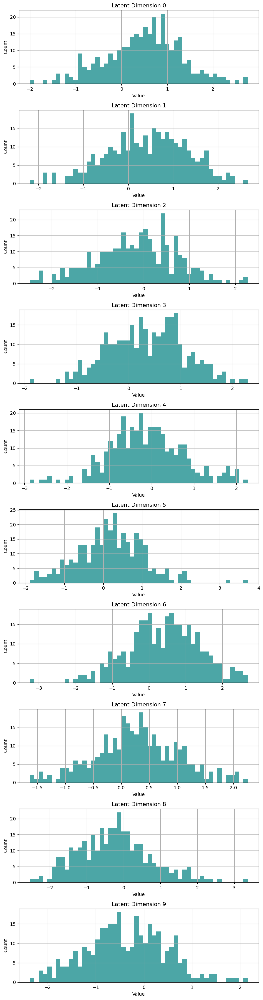


Reconstruction Relative Error: 4.6715
Reconstruction Accuracy: -367.15%


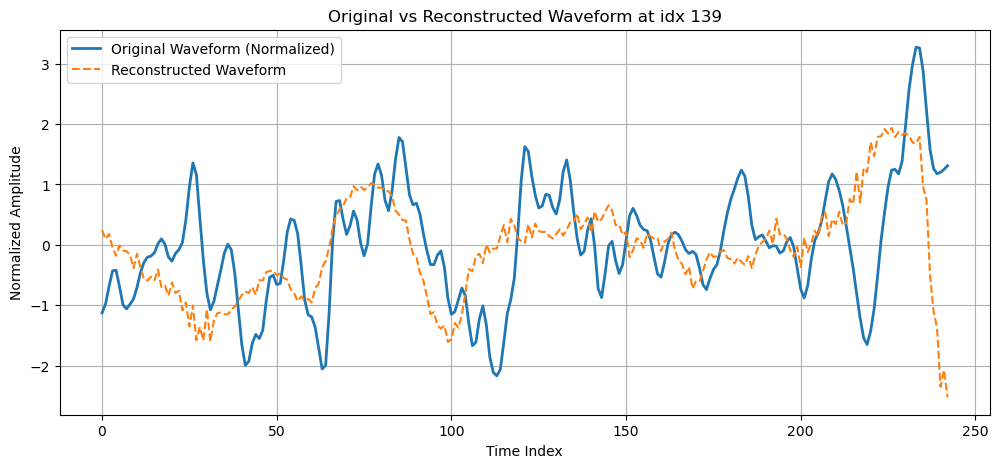

In [52]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import random

# --- Prepare the data (already normalized per row) ---
all_waves = []
all_levels = []

for waveforms, lvl in filtered_list:
    for wave in waveforms:
        wave = wave.astype(np.float32)
        mean = np.mean(wave)
        std = np.std(wave) + 1e-8
        norm_wave = (wave - mean) / std
        all_waves.append(norm_wave)
        all_levels.append(lvl)

all_waves = np.stack(all_waves)  # shape [N, 243]
x_tensor = torch.tensor(all_waves).to(torch.float32).to(device)

# --- Encode and reconstruct ---
model.eval()
with torch.no_grad():
    x_tensor_unsq = x_tensor.unsqueeze(1).to(device)  # [N, 1, 243]
    z, mu, logvar = model.encode(x_tensor_unsq)
    x_recon_full = model.decode(z).squeeze(1)  # [N, 256]
    center_crop_start = (x_recon_full.shape[1] - 243) // 2
    x_recon = x_recon_full[:, center_crop_start:center_crop_start + 243]  # [N, 243]


# --- Latent Space Visualization ---
z = z.detach().cpu().numpy()

latent_dim = z.shape[1]
fig, axes = plt.subplots(latent_dim, 1, figsize=(8, 3 * latent_dim))
if latent_dim == 1:
    axes = [axes]
for i in range(latent_dim):
    axes[i].hist(z[:, i], bins=50, alpha=0.7, color='teal')
    axes[i].set_title(f'Latent Dimension {i}')
    axes[i].set_xlabel("Value")
    axes[i].set_ylabel("Count")
    axes[i].grid(True)

plt.tight_layout()
plt.show()

# --- Accuracy calculation (e.g., normalized L1 error) ---
x_orig = x_tensor.detach().cpu().numpy()
x_recon_np = x_recon.detach().cpu().numpy()

abs_diff = np.abs(x_orig - x_recon_np)
abs_orig = np.abs(x_orig)

# Avoid divide-by-zero
recon_error = np.mean(abs_diff / (abs_orig + 1e-8))
recon_accuracy = 1 - recon_error

print(f"\nReconstruction Relative Error: {recon_error:.4f}")
print(f"Reconstruction Accuracy: {recon_accuracy * 100:.2f}%")

# --- Plot one random waveform ---
idx = random.randint(0, x_tensor.shape[0] - 1)
original_np = x_tensor[idx].detach().cpu().numpy().flatten()
reconstructed_np = x_recon[idx].detach().cpu().numpy().flatten()

plt.figure(figsize=(12, 5))
plt.plot(original_np, label='Original Waveform (Normalized)', linewidth=2)
plt.plot(reconstructed_np, label='Reconstructed Waveform', linestyle='--')
plt.title(f"Original vs Reconstructed Waveform at idx {idx}")
plt.xlabel("Time Index")
plt.ylabel("Normalized Amplitude")
plt.legend()
plt.grid(True)
plt.show()


In [71]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import random

def analyze_latent_extremes(model, filtered_list, device='cpu', latent_dim_index=0):
    # --- Prepare and normalize wave data ---
    all_waves = []
    all_levels = []

    for waveforms, lvl in filtered_list:
        for wave in waveforms:
            wave = wave.astype(np.float32)
            mean = np.mean(wave)
            std = np.std(wave) + 1e-8
            norm_wave = (wave - mean) / std
            all_waves.append(norm_wave)
            all_levels.append(lvl)

    all_waves = np.stack(all_waves)  # shape [N, 243]
    x_tensor = torch.tensor(all_waves).to(torch.float32).to(device)

    # --- Encode and Reconstruct ---
    model.eval()
    with torch.no_grad():
        x_tensor_unsq = x_tensor.unsqueeze(1)  # [N, 1, 243]
        z, mu, logvar = model.encode(x_tensor_unsq)
        x_recon_full = model.decode(z).squeeze(1)  # [N, ~256]
        center_crop_start = (x_recon_full.shape[1] - 243) // 2
        x_recon = x_recon_full[:, center_crop_start:center_crop_start + 243]  # [N, 243]

    # --- Convert to NumPy ---
    z_np = z.detach().cpu().numpy()
    x_orig = x_tensor.detach().cpu().numpy()
    x_recon_np = x_recon.detach().cpu().numpy()

    # --- Extract extreme values from selected latent dimension ---
    target_z = z_np[:, latent_dim_index]
    N = len(target_z)
    num_extreme = max(1, N // 10)  # 10% of total

    sorted_indices = np.argsort(target_z)
    extreme_neg_indices = sorted_indices[:2]
    extreme_pos_indices = sorted_indices[-2:]

    group_neg_indices = sorted_indices[:num_extreme]
    group_pos_indices = sorted_indices[-num_extreme:]

    selected_indices = list(extreme_neg_indices) + list(extreme_pos_indices)

    # --- Latent Histogram with Red Markers ---
    plt.figure(figsize=(10, 4))
    plt.hist(target_z, bins=50, alpha=0.7, color='teal')
    for idx in selected_indices:
        plt.axvline(target_z[idx], color='red', linestyle='--', linewidth=1.5)
    plt.title(f"Latent Dimension {latent_dim_index} Distribution (with 6 extremes)")
    plt.xlabel("Value")
    plt.ylabel("Count")
    plt.grid(True)
    plt.show()

    # --- Plot original vs reconstructed for 6 extremes ---
    fig, axs = plt.subplots(2, 2, figsize=(14, 10))
    axs = axs.flatten()

    for i, idx in enumerate(selected_indices):
        axs[i].plot(x_orig[idx], label='Original', linewidth=2)
        axs[i].plot(x_recon_np[idx], label='Reconstructed', linestyle='--')
        axs[i].set_title(f"Wave idx {idx} | z[{latent_dim_index}] = {target_z[idx]:.3f}")
        axs[i].legend()
        axs[i].grid(True)

    plt.tight_layout()
    plt.show()

    # # --- Plot all original waves in Negative Group ---
    # plt.figure(figsize=(12, 6))
    # for idx in group_neg_indices:
    #     plt.plot(x_orig[idx], color='blue', alpha=0.2)
    # mean_neg = np.mean(x_orig[group_neg_indices], axis=0)
    # plt.plot(mean_neg, color='black', linewidth=2, label='Mean of Negative Group')
    # plt.title(f"Original Waves (Negative Group: bottom 5% of z[{latent_dim_index}])")
    # plt.xlabel("Time Index")
    # plt.ylabel("Normalized Amplitude")
    # plt.legend()
    # plt.grid(True)
    # plt.show()

    # # --- Plot all original waves in Positive Group ---
    # plt.figure(figsize=(12, 6))
    # for idx in group_pos_indices:
    #     plt.plot(x_orig[idx], color='orange', alpha=0.2)
    # mean_pos = np.mean(x_orig[group_pos_indices], axis=0)
    # plt.plot(mean_pos, color='black', linewidth=2, label='Mean of Positive Group')
    # plt.title(f"Original Waves (Positive Group: top 5% of z[{latent_dim_index}])")
    # plt.xlabel("Time Index")
    # plt.ylabel("Normalized Amplitude")
    # plt.legend()
    # plt.grid(True)
    # plt.show()
    global_mean = np.mean(x_orig, axis=0)


    # --- Plot all original waves in Negative Group ---
    print(f"Negative Group (bottom 5% of z[{latent_dim_index}]): {len(group_neg_indices)} waveforms")
    plt.figure(figsize=(12, 6))
    for idx in group_neg_indices:
        plt.plot(x_orig[idx], color='orange', alpha=0.5)
    mean_neg = np.mean(x_orig[group_neg_indices], axis=0)
    plt.plot(mean_neg, color='black', linewidth=2, label='Mean of Negative Group')
    plt.plot(global_mean, color='red', linestyle='--', linewidth=2, label='Global Mean')
    plt.title(f"Original Waves (Negative Group: bottom 5% of z[{latent_dim_index}])")
    plt.xlabel("Time Index")
    plt.ylabel("Normalized Amplitude")
    plt.legend()
    plt.grid(True)
    plt.show()

    # --- Plot all original waves in Positive Group ---
    print(f"Positive Group (top 5% of z[{latent_dim_index}]): {len(group_pos_indices)} waveforms")
    plt.figure(figsize=(12, 6))
    for idx in group_pos_indices:
        plt.plot(x_orig[idx], color='orange', alpha=0.5)
    mean_pos = np.mean(x_orig[group_pos_indices], axis=0)
    plt.plot(mean_pos, color='black', linewidth=2, label='Mean of Positive Group')
    plt.plot(global_mean, color='red', linestyle='--', linewidth=2, label='Global Mean')
    plt.title(f"Original Waves (Positive Group: top 5% of z[{latent_dim_index}])")
    plt.xlabel("Time Index")
    plt.ylabel("Normalized Amplitude")
    plt.legend()
    plt.grid(True)
    plt.show()


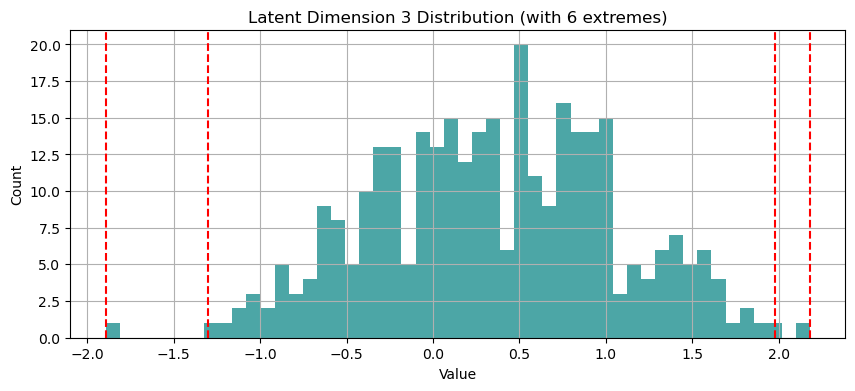

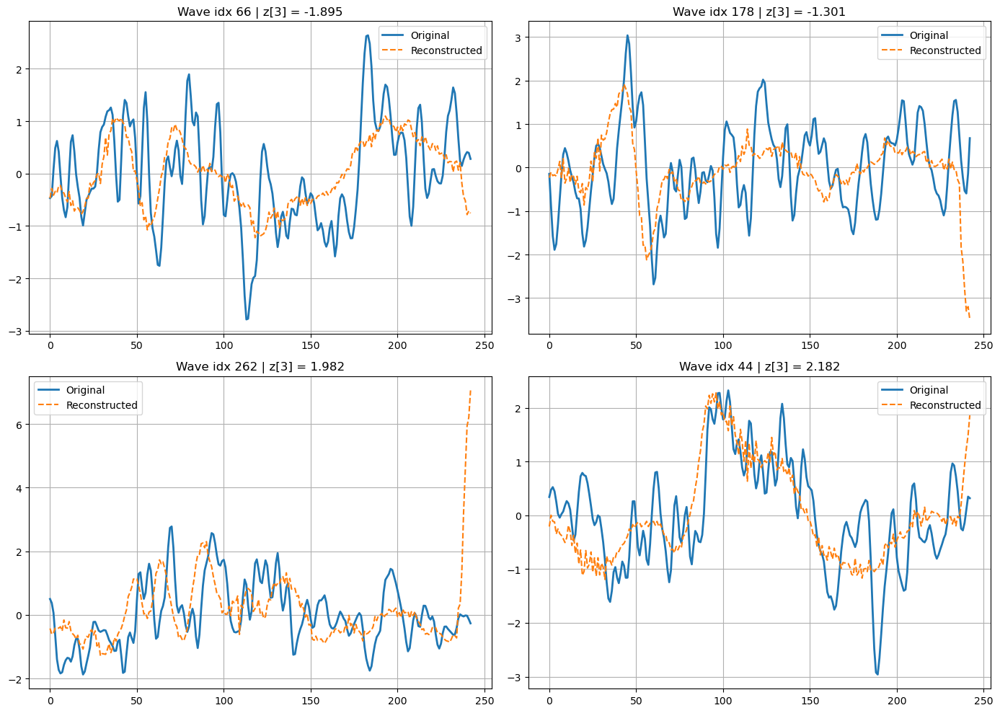

Negative Group (bottom 5% of z[3]): 31 waveforms


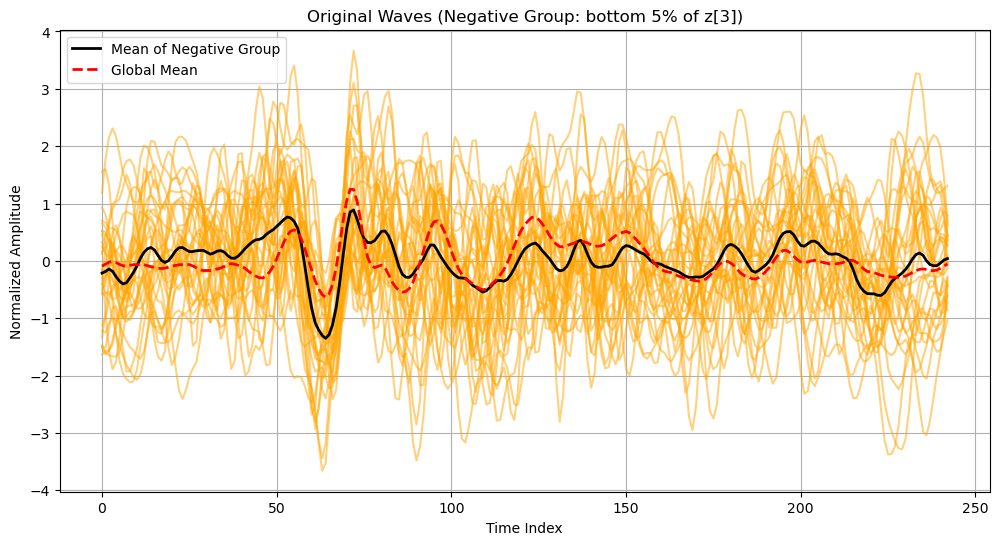

Positive Group (top 5% of z[3]): 31 waveforms


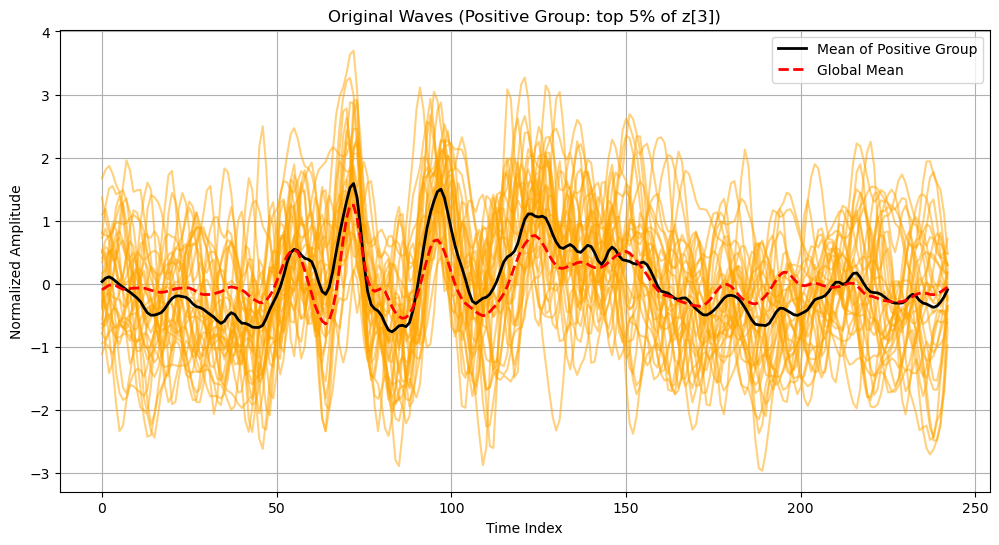

In [72]:
# Run it on a trained model with filtered_list and your selected latent index
analyze_latent_extremes(model, filtered_list, device=device, latent_dim_index=3)


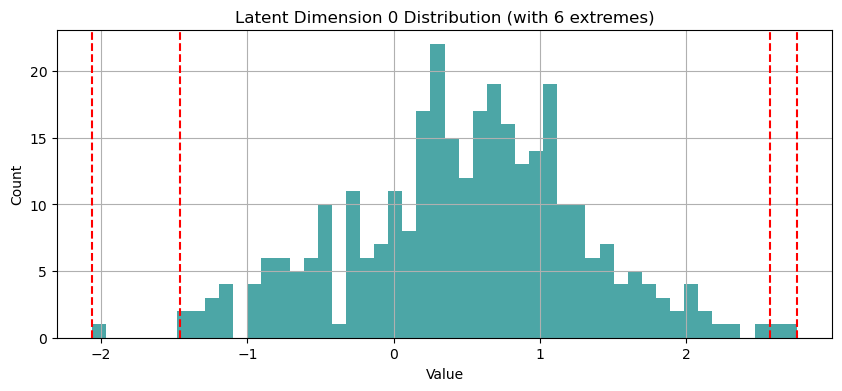

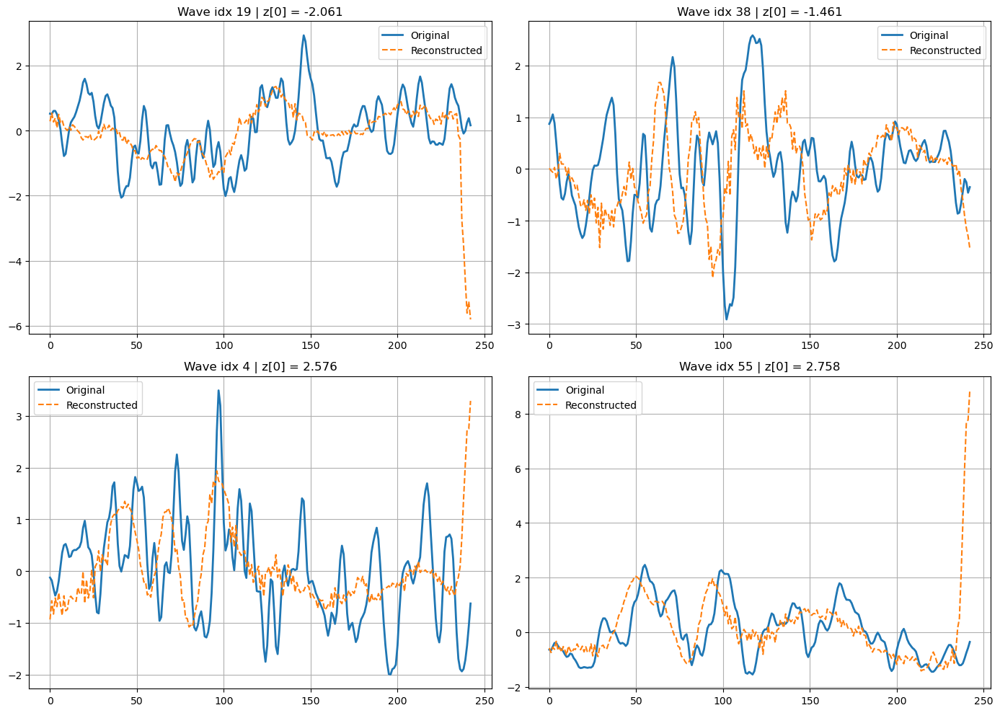

Negative Group (bottom 5% of z[0]): 31 waveforms


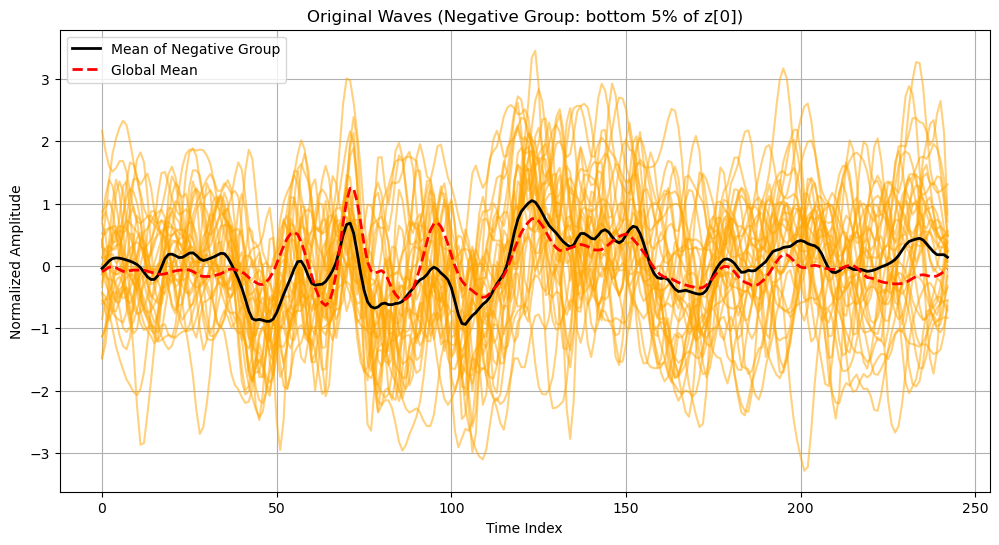

Positive Group (top 5% of z[0]): 31 waveforms


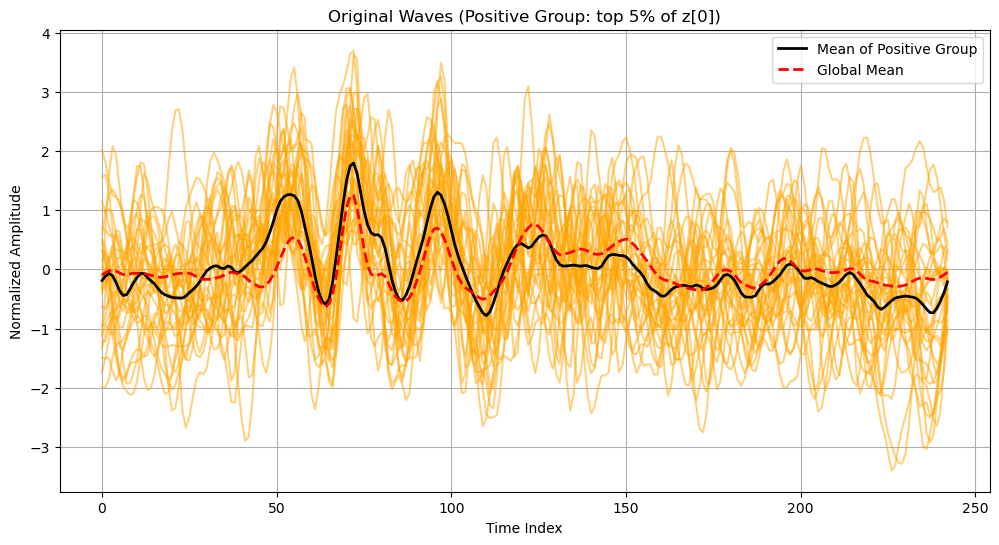

In [73]:
analyze_latent_extremes(model, filtered_list, device=device, latent_dim_index=0)

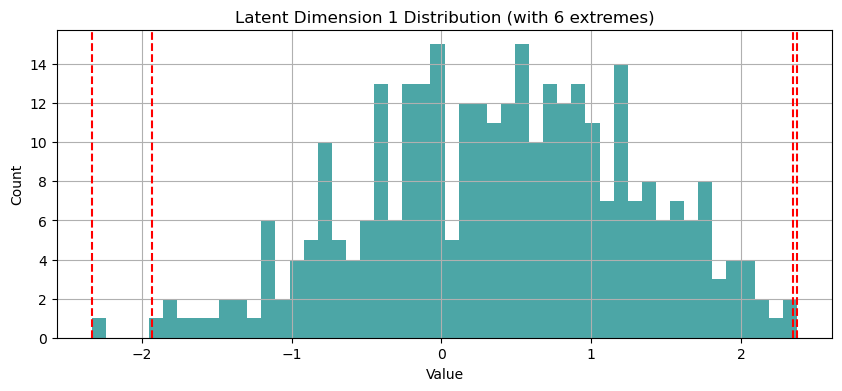

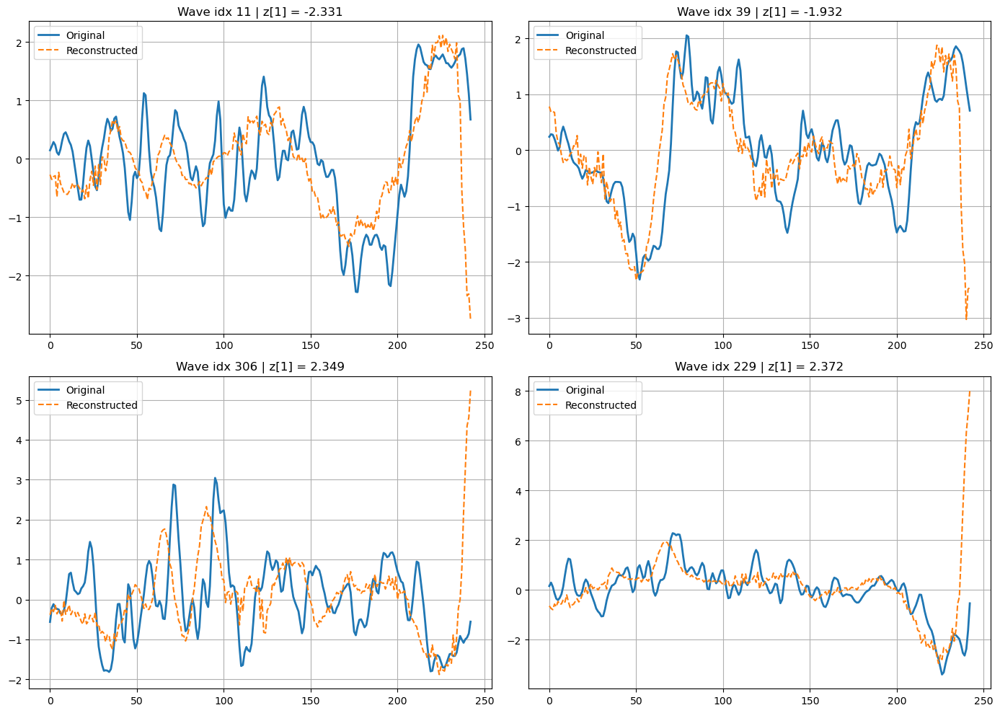

Negative Group (bottom 5% of z[1]): 31 waveforms


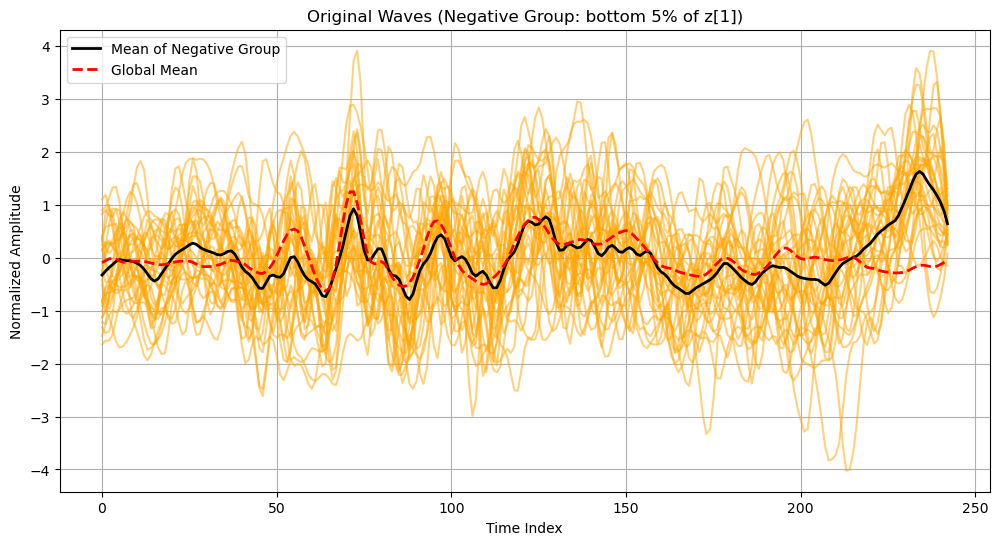

Positive Group (top 5% of z[1]): 31 waveforms


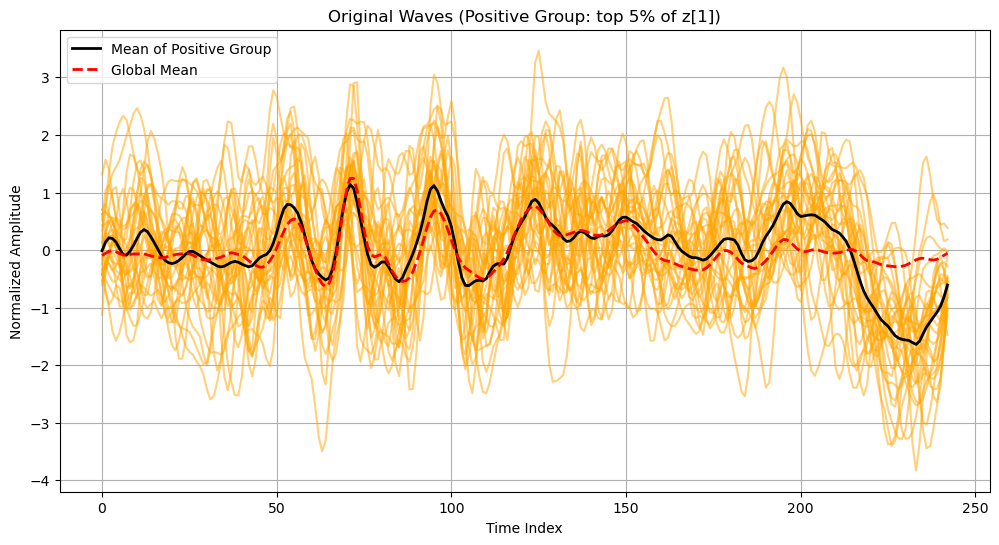

In [74]:
analyze_latent_extremes(model, filtered_list, device=device, latent_dim_index=1)

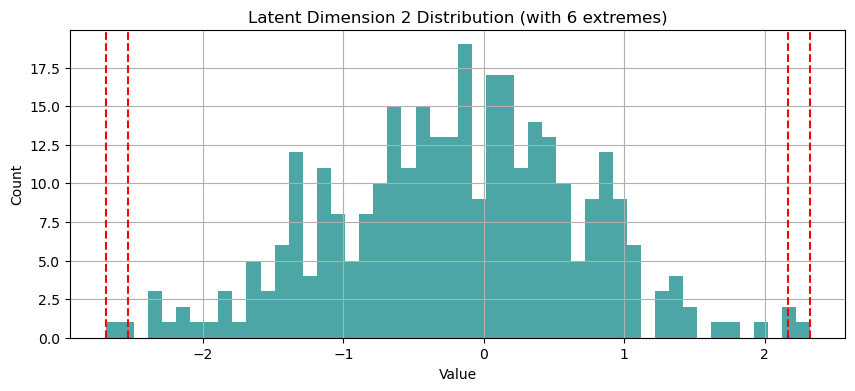

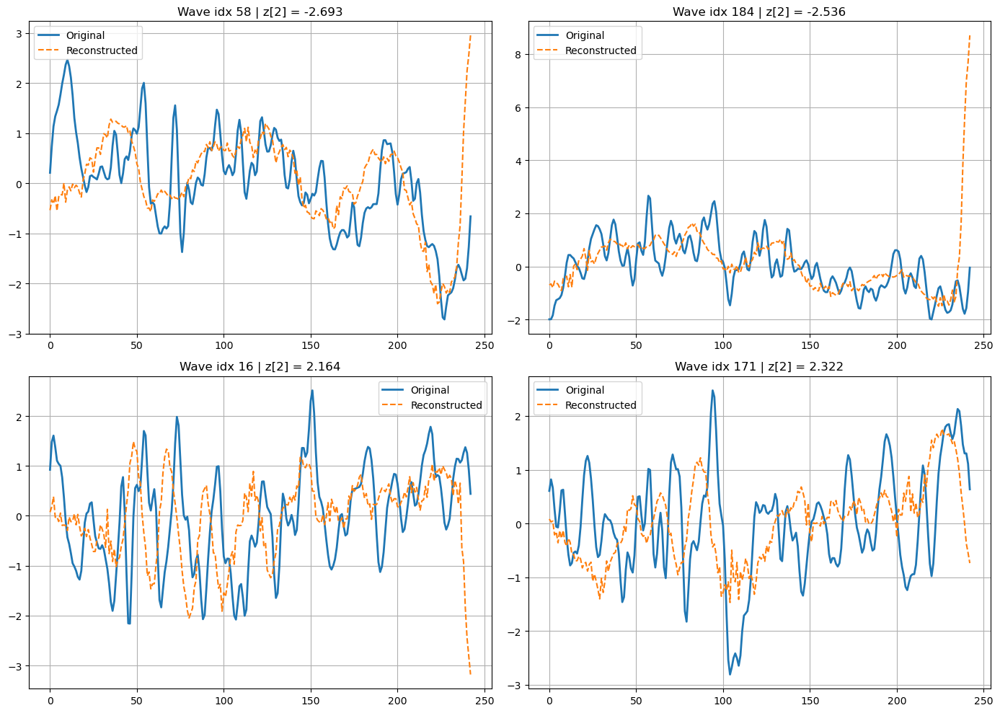

Negative Group (bottom 5% of z[2]): 31 waveforms


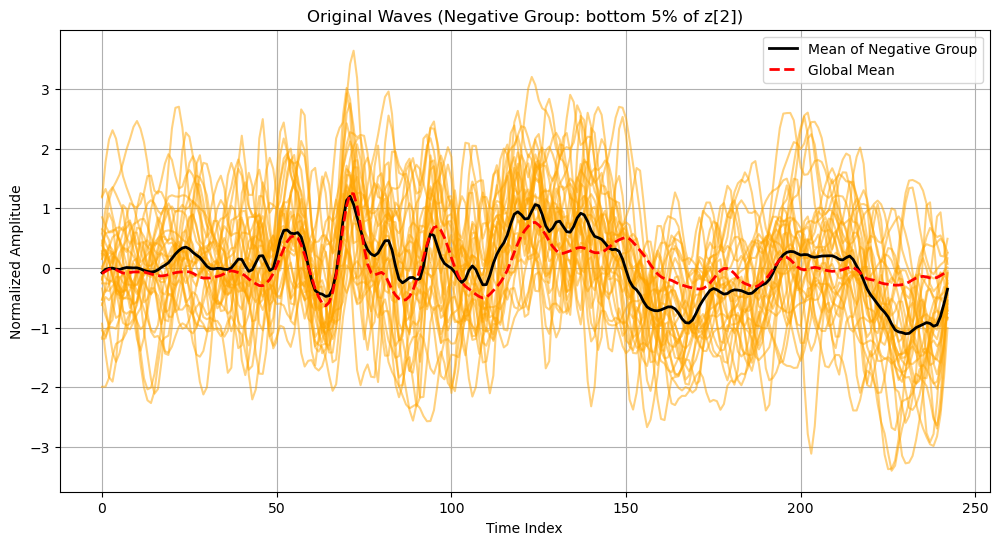

Positive Group (top 5% of z[2]): 31 waveforms


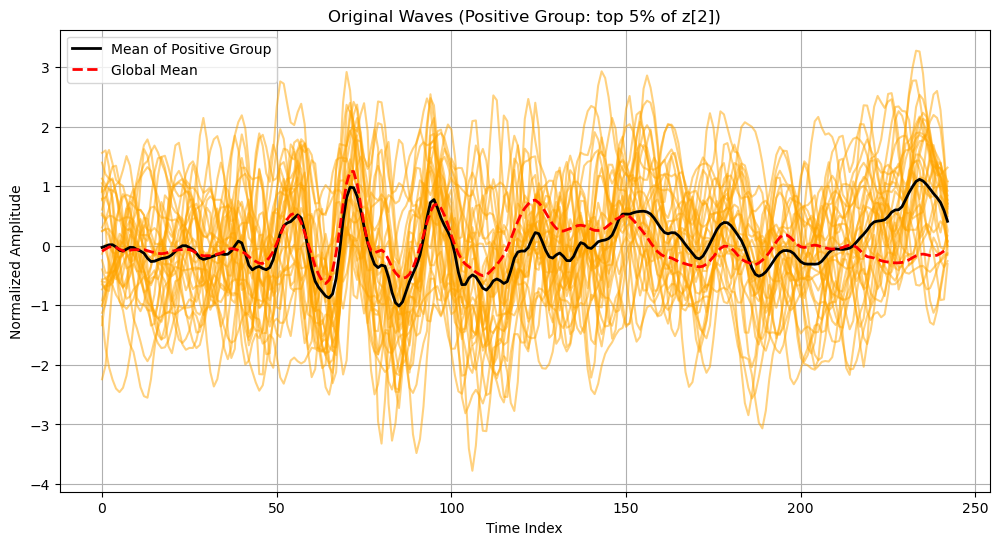

In [75]:
analyze_latent_extremes(model, filtered_list, device=device, latent_dim_index=2)

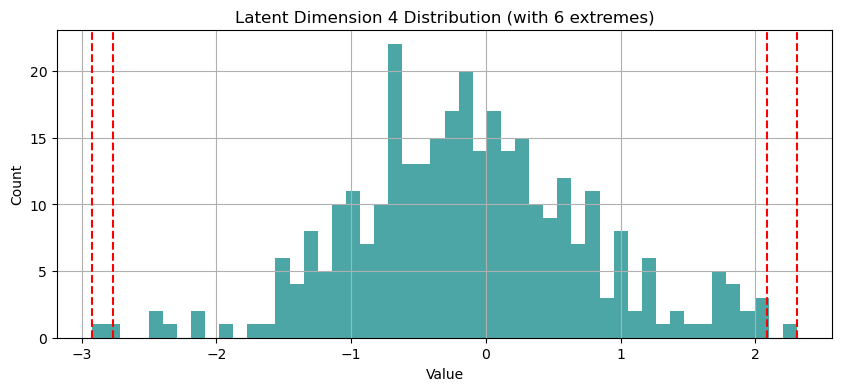

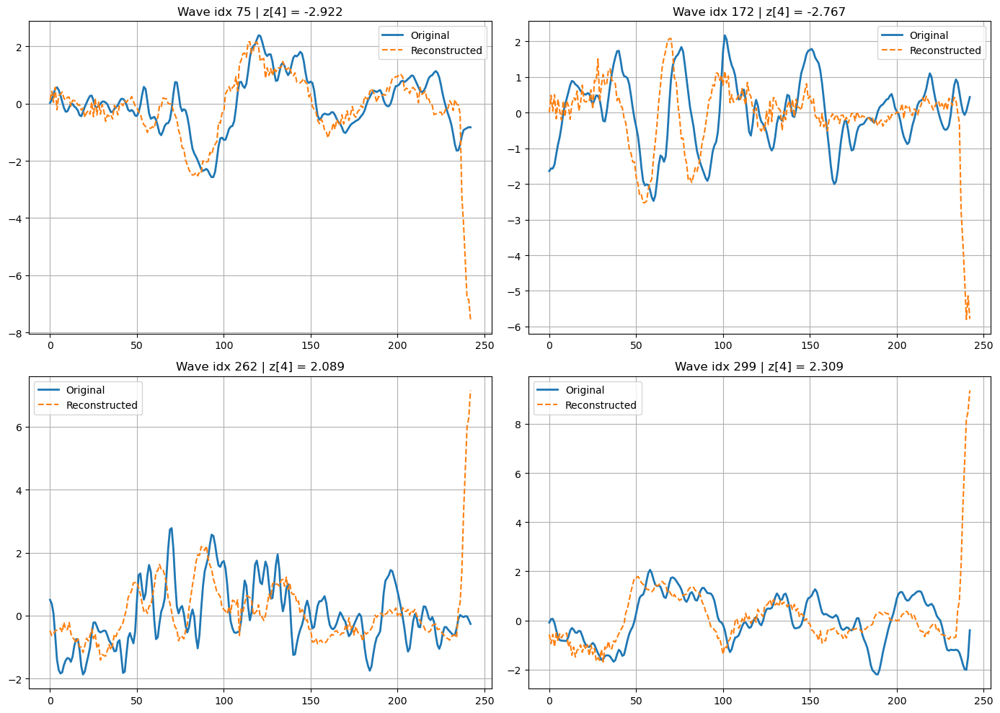

Negative Group (bottom 5% of z[4]): 31 waveforms


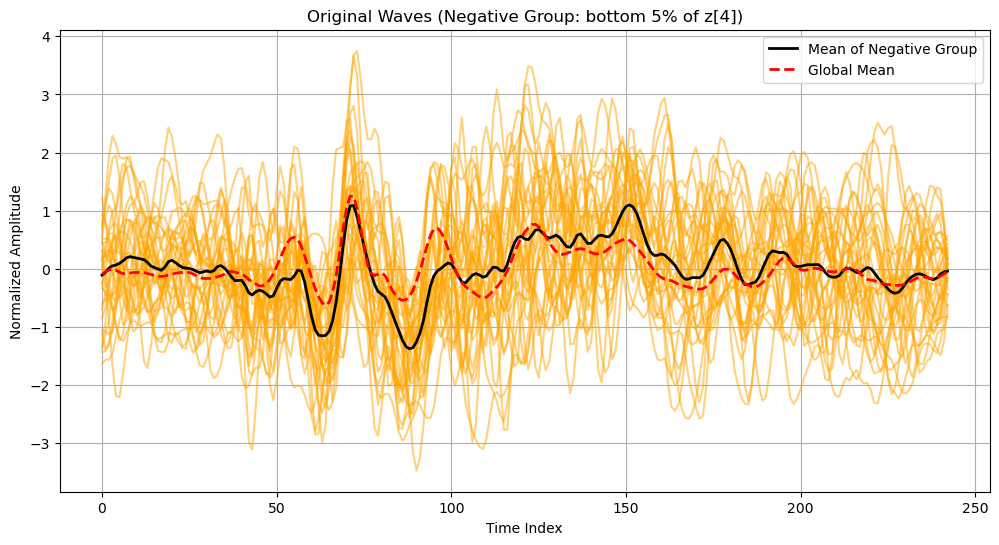

Positive Group (top 5% of z[4]): 31 waveforms


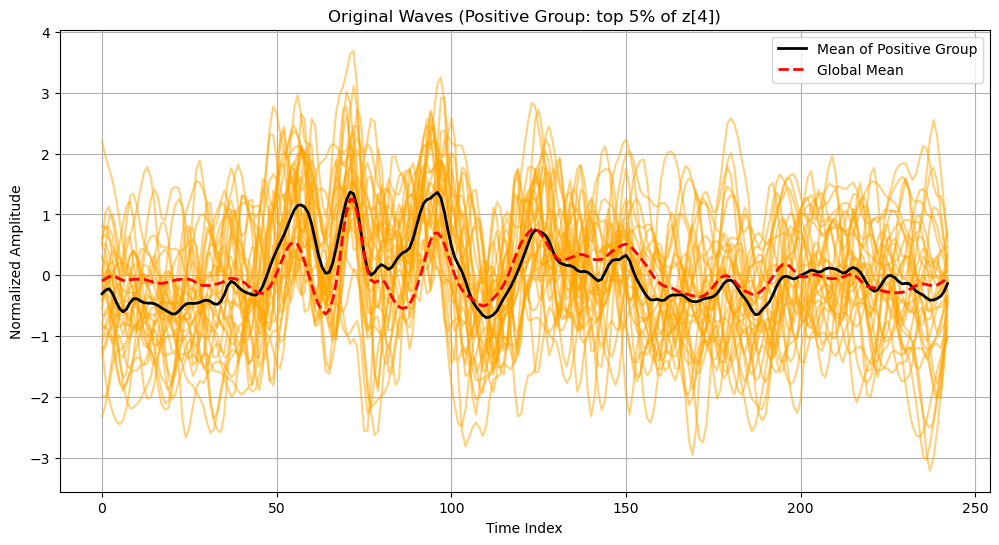

In [76]:
analyze_latent_extremes(model, filtered_list, device=device, latent_dim_index=4)

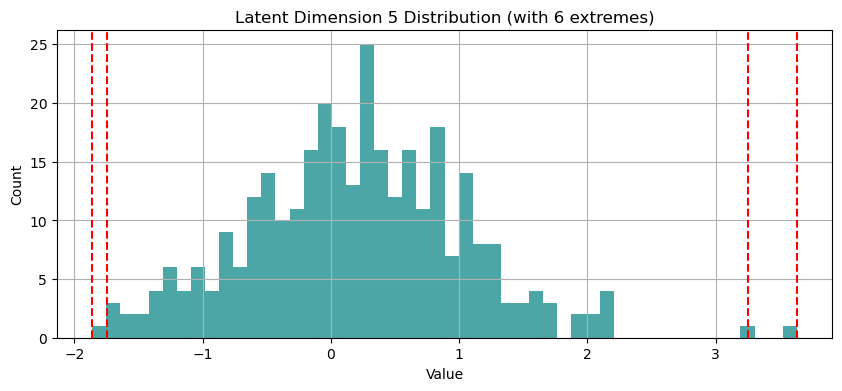

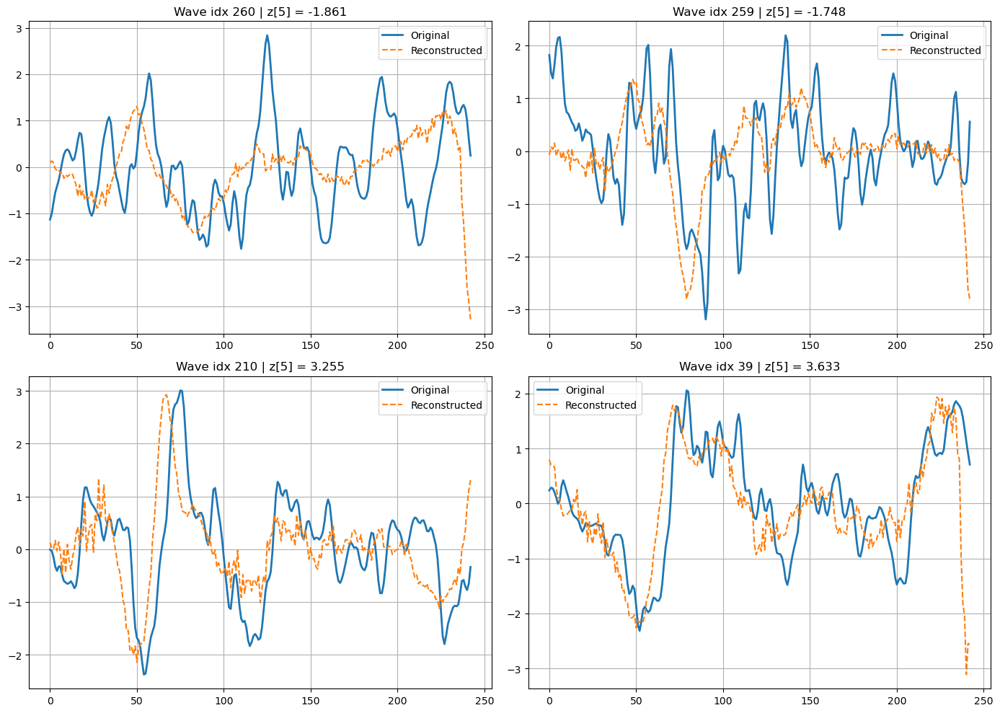

Negative Group (bottom 5% of z[5]): 31 waveforms


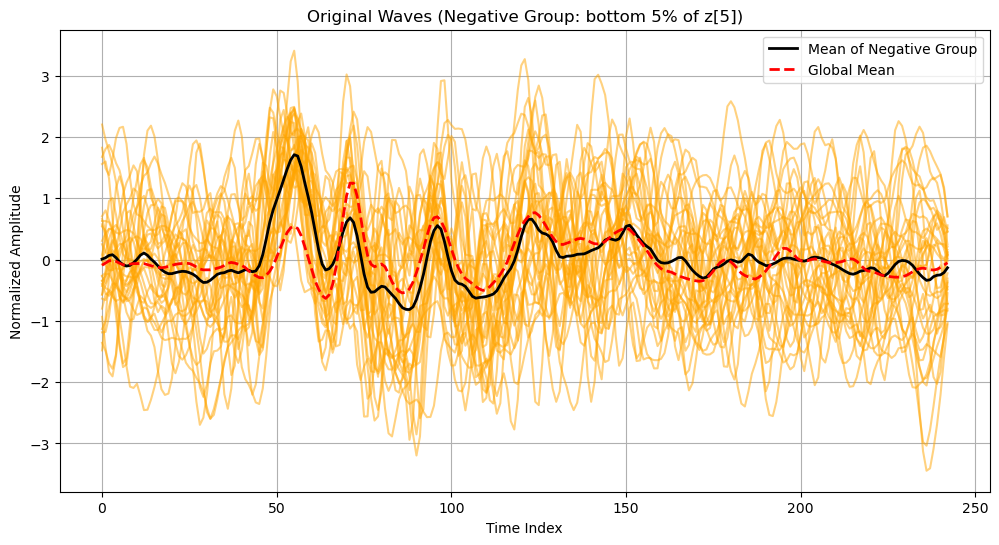

Positive Group (top 5% of z[5]): 31 waveforms


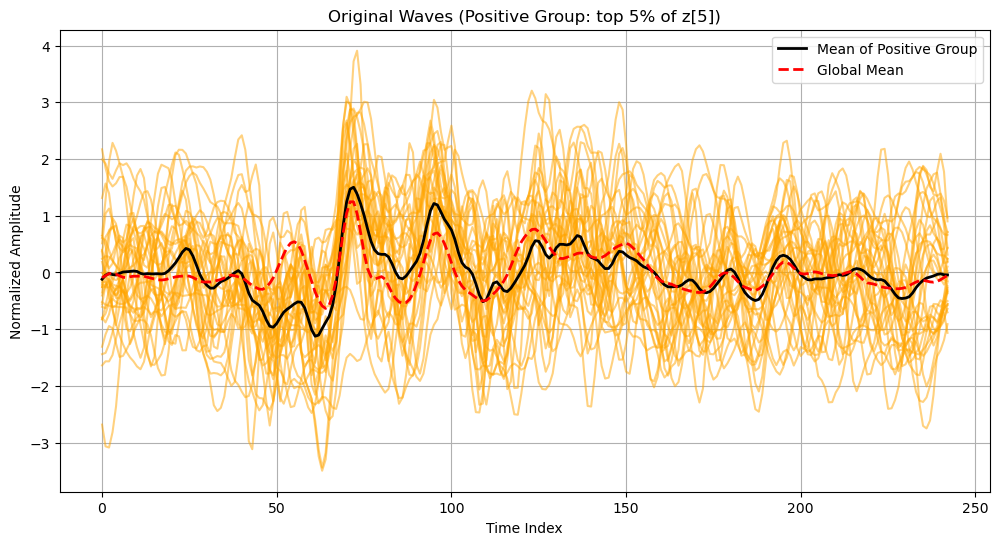

In [77]:
analyze_latent_extremes(model, filtered_list, device=device, latent_dim_index=5)

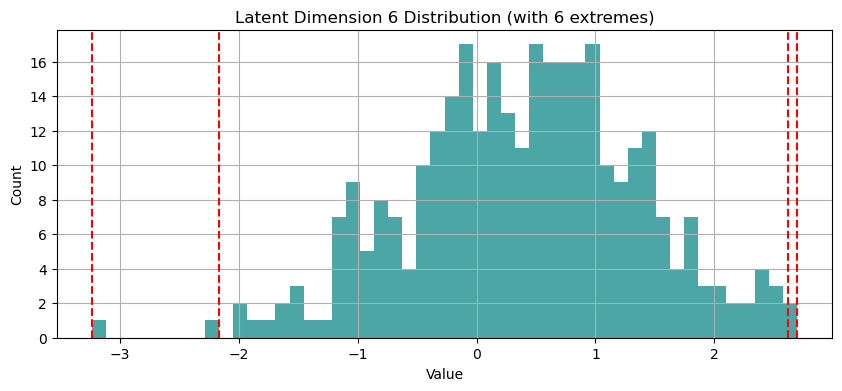

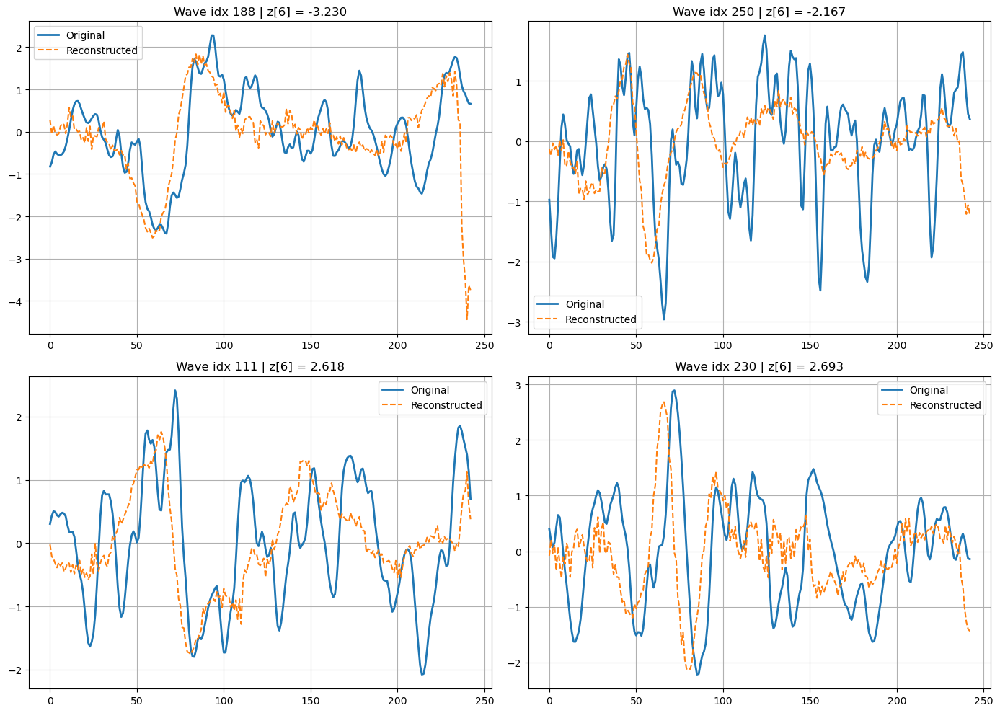

Negative Group (bottom 5% of z[6]): 31 waveforms


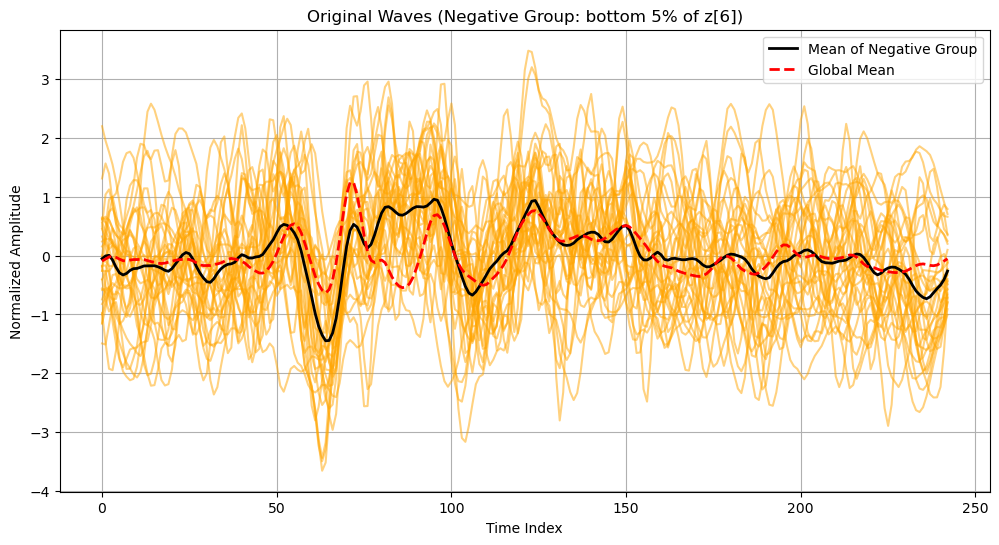

Positive Group (top 5% of z[6]): 31 waveforms


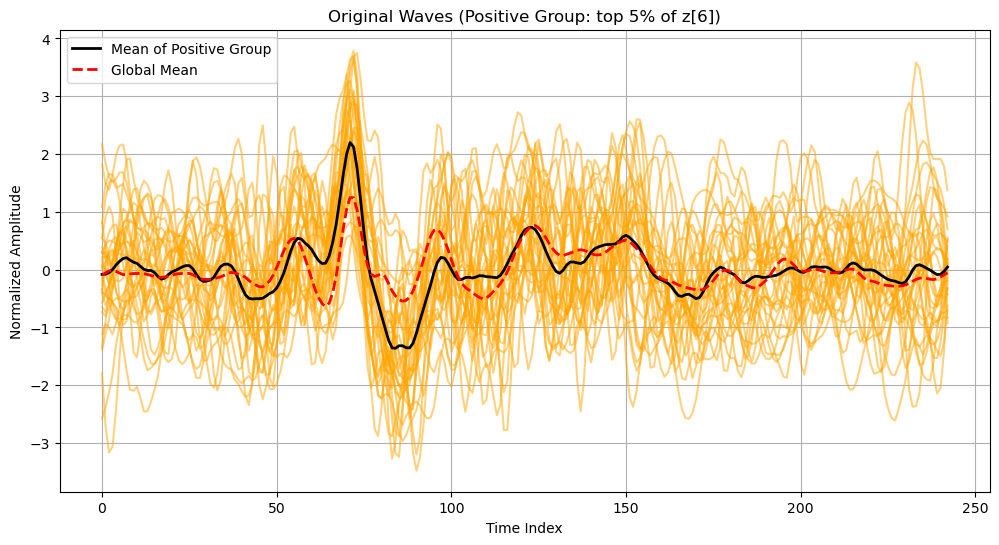

In [78]:
analyze_latent_extremes(model, filtered_list, device=device, latent_dim_index=6)

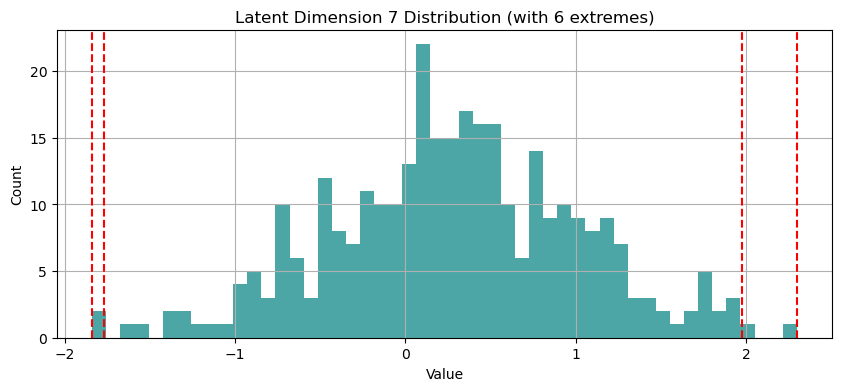

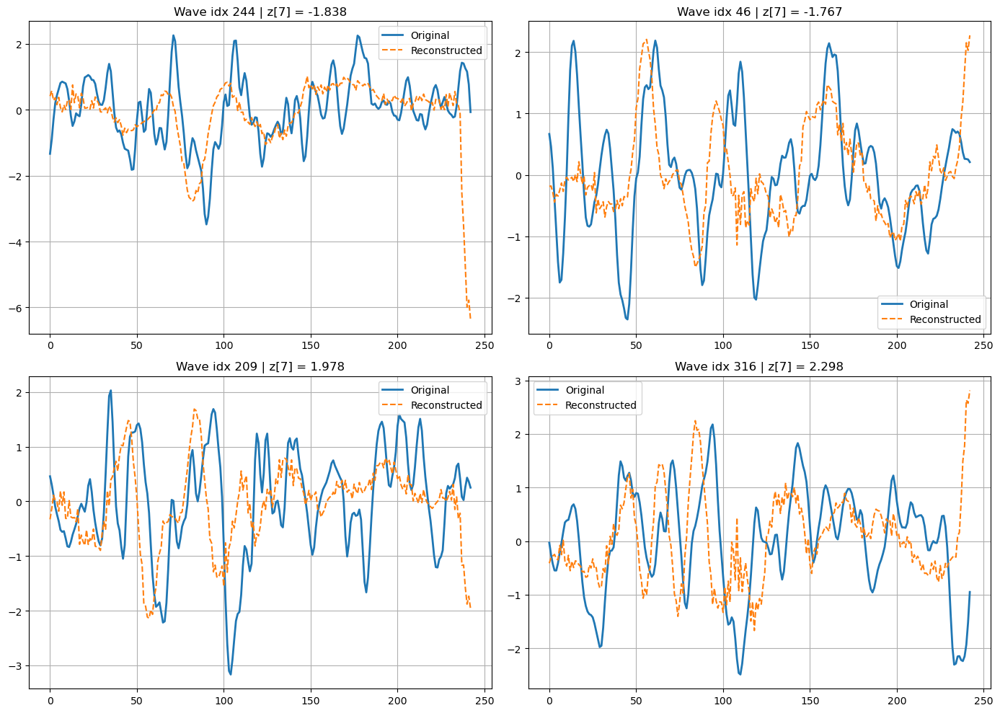

Negative Group (bottom 5% of z[7]): 31 waveforms


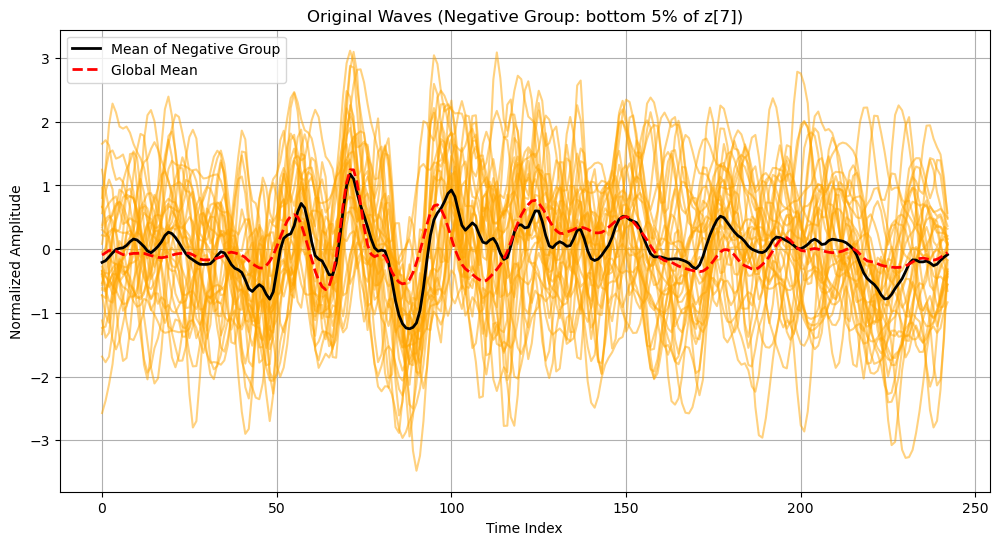

Positive Group (top 5% of z[7]): 31 waveforms


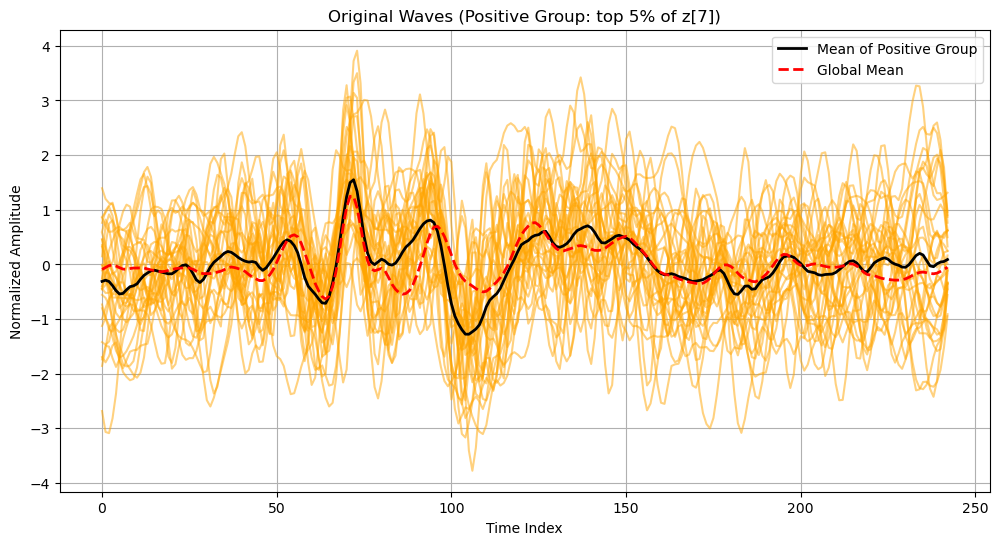

In [79]:
analyze_latent_extremes(model, filtered_list, device=device, latent_dim_index=7)

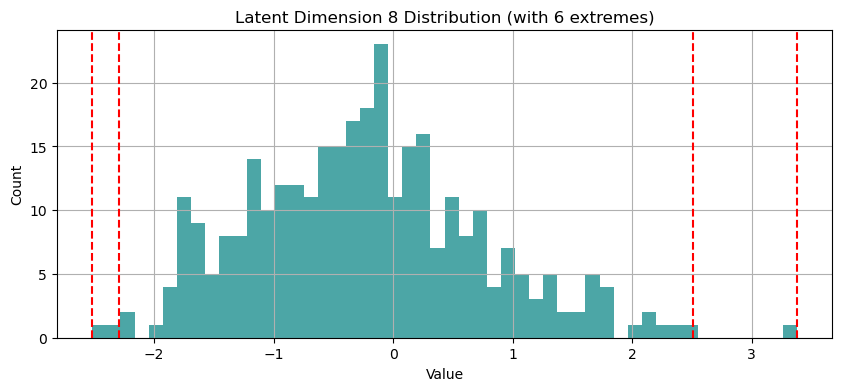

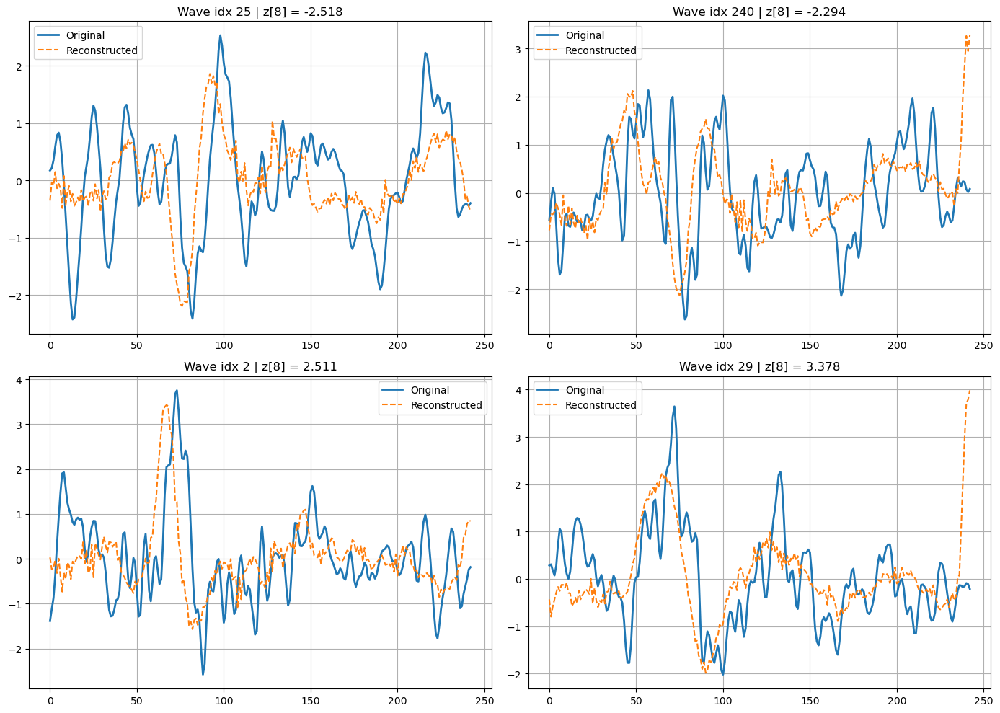

Negative Group (bottom 5% of z[8]): 31 waveforms


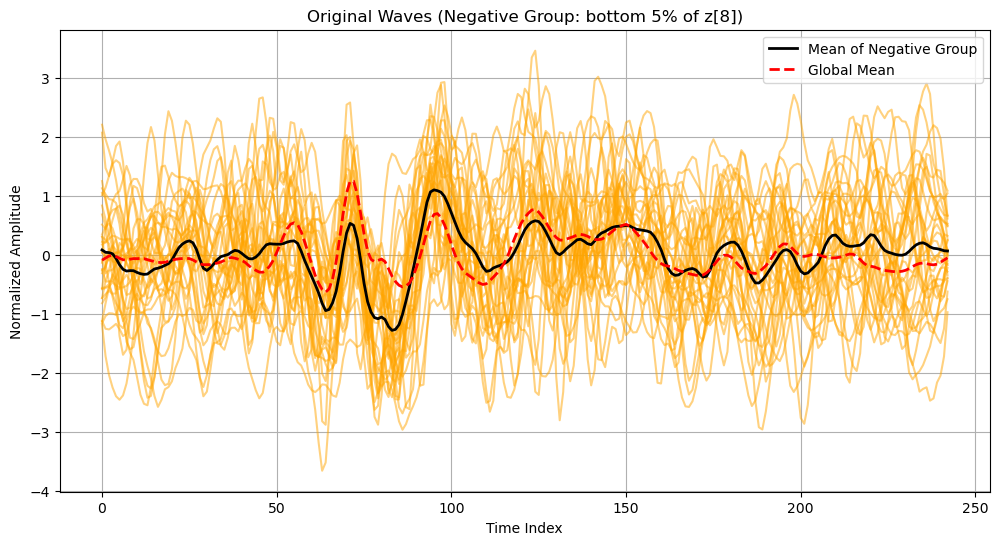

Positive Group (top 5% of z[8]): 31 waveforms


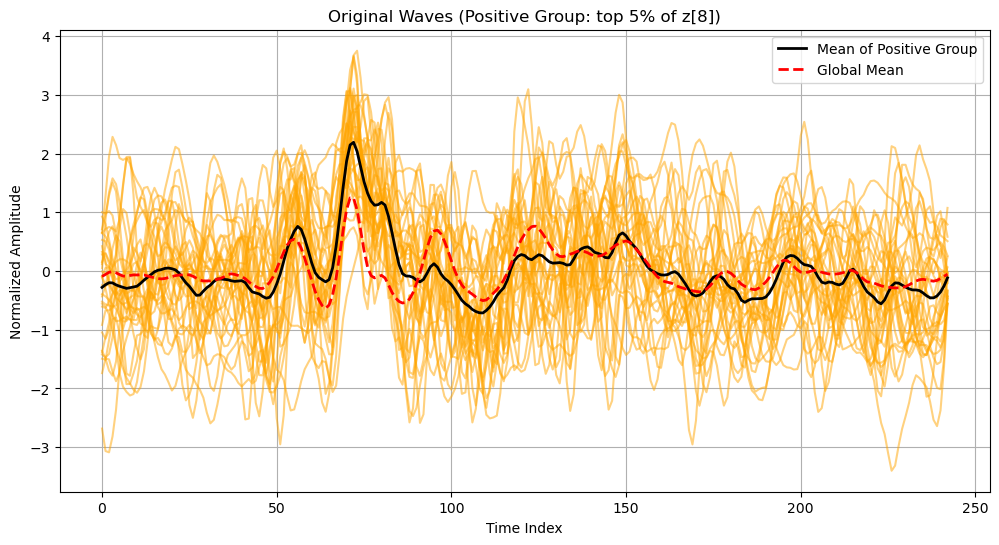

In [80]:
analyze_latent_extremes(model, filtered_list, device=device, latent_dim_index=8)

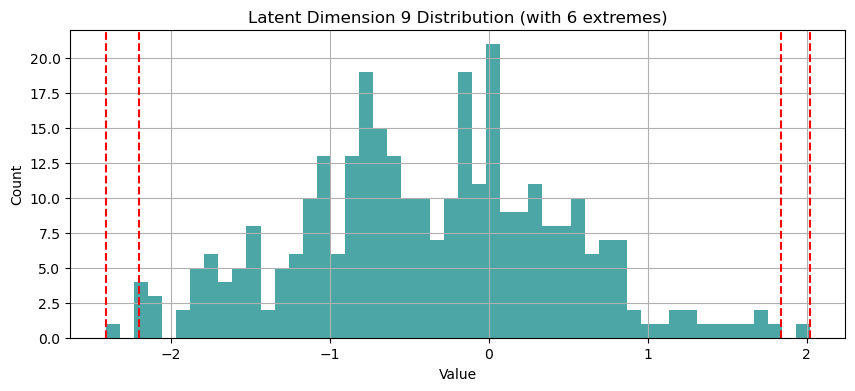

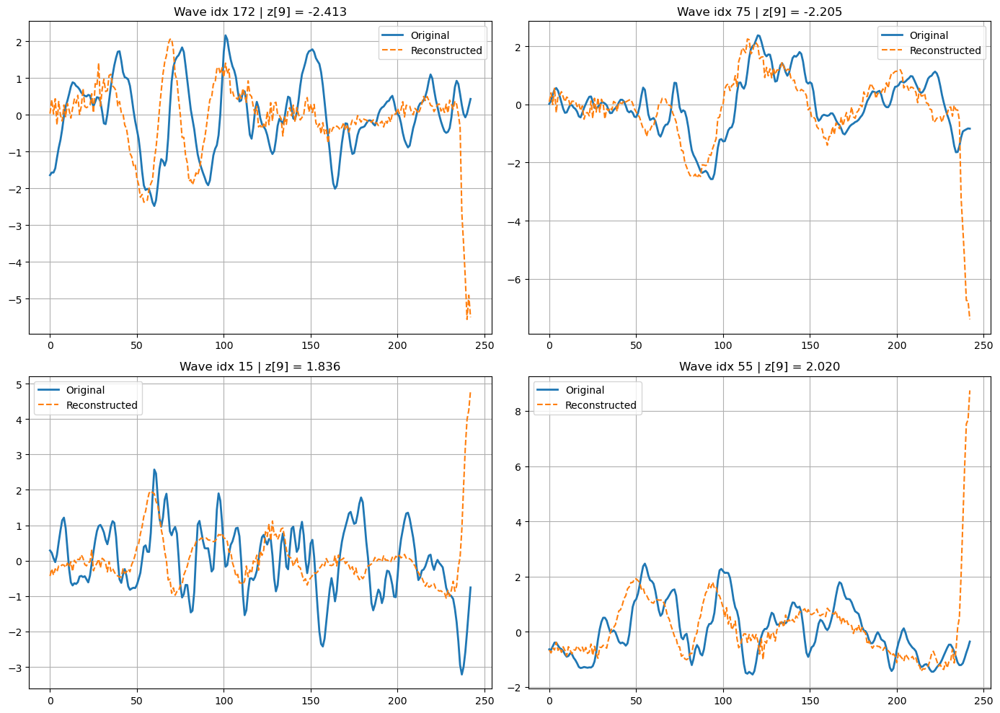

Negative Group (bottom 5% of z[9]): 31 waveforms


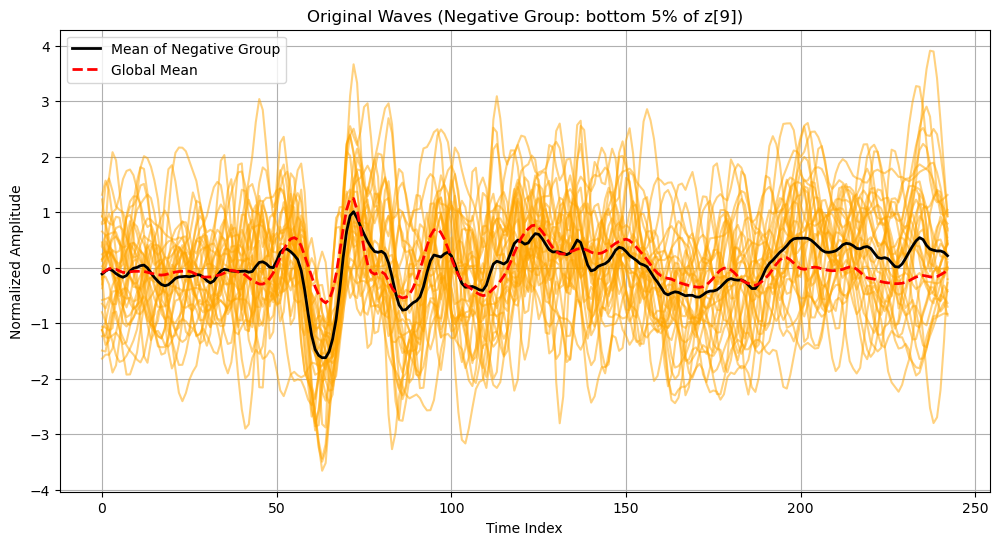

Positive Group (top 5% of z[9]): 31 waveforms


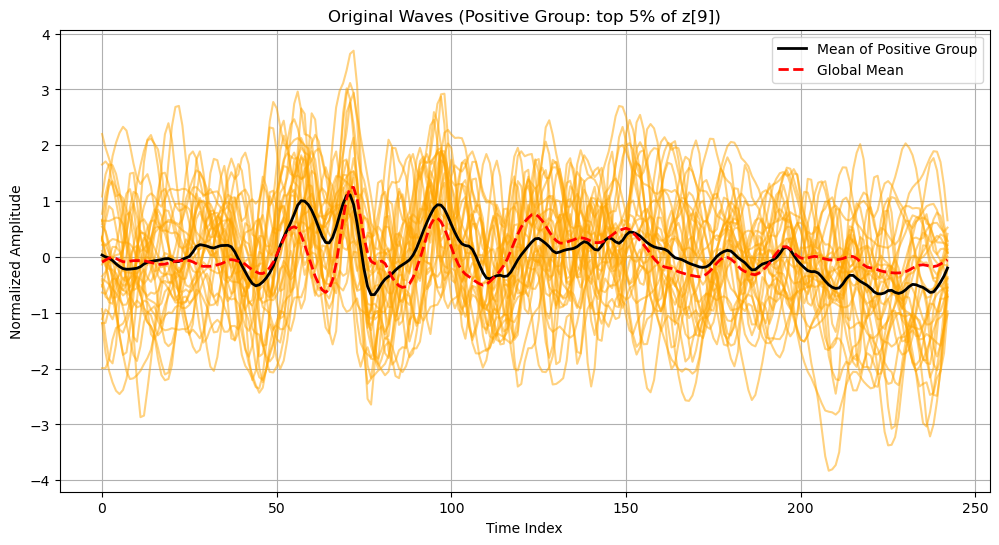

In [81]:
analyze_latent_extremes(model, filtered_list, device=device, latent_dim_index=9)